# Data visualization with Stata

-- Hua Peng @ StataCorp

* Creating graphs in Stata is easy.
* Stata supports a wide variety of plots.
* Stata graphic commands are highly customizable and extensible.

This presentation uses PyStata: see <https://www.stata.com/python/pystata18/> for details.

In [1]:
import stata_setup
stata_setup.config('C:/Program Files/Stata18', 'mp')


  ___  ____  ____  ____  ____ ®
 /__    /   ____/   /   ____/      StataNow 18.5
___/   /   /___/   /   /___/       MP—Parallel Edition

 Statistics and Data Science       Copyright 1985-2023 StataCorp LLC
                                   StataCorp
                                   4905 Lakeway Drive
                                   College Station, Texas 77845 USA
                                   800-782-8272        https://www.stata.com
                                   979-696-4600        service@stata.com

Stata license: 10-user 4-core network perpetual
Serial number: 1
  Licensed to: Stata Developer
               StataCorp LLC

Notes:
      1. Unicode is supported; see help unicode_advice.
      2. More than 2 billion observations are allowed; see help obs_advice.
      3. Maximum number of variables is set to 5,000 but can be increased;
          see help set_maxvar.


## *graph* command history:

In [2]:
%%stata -qui

clear
input float version str60 notes float(date z year) byte weight
 8 "new graph command {superscript:1}"                       15707 0 2003 1
 9 "new plot types, png export, etc."                        16548 0 2005 0
10 "graph editor"                                            17342 0 2007 1
11 "smcl tags in text"                                       18091 0 2009 0
12 "marginsplot, contour plot, export pdf"                   18833 0 2011 0
13 "improvements of marginsplot"                             19526 0 2013 0
14 "Unicode支持"                                             20180 0 2015 1
15 "color transparency, new marker symbols, and svg export"  20976 0 2017 1
16 "meta forestplot, size in points, inches, or centimeters" 21726 0 2019 0
17 "more meta and bayes plots"                               22390 0 2021 0
18 "new schemes, new color styles, and colorvar()"           23125 0 2023 1
end
format %td date
label var version "Stata version" 
label var z "Major features" 
label var year "Release year" 

twoway (scatter version z if weight==0, mlabel(notes) msymbol(none))				///
	(scatter version z if weight==1, mlabel(notes) mlabsize(*1.5)  msymbol(none)) 	///
	(scatter year z, mcolor(none) 	/// 
		yscale(noline axis(2)) 	///
		ylabel(2003(2)2023, axis(2) notick nogrid) yaxis(2)), 	///
	yscale(noline) ylabel(8(1)18, notick nogrid)	/// 
	xlabel(0 2, nogrid noticks nolabels) 	///
	xscale(noline noextend)	///	
	legend(off) xtitle("") 	///
	title("Major graphic features in each release") 	///
	note("1. old graph command can be invoked with {bf:graph7}") nodraw

graph save gr_history.gph, replace


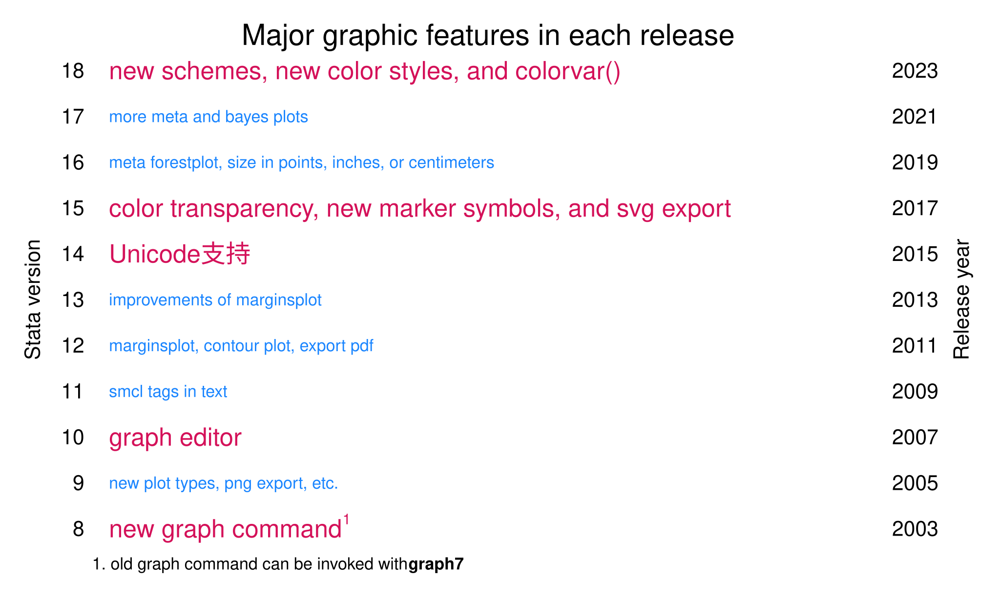

In [3]:
%stata graph use gr_history.gph

## *graph* command overview:

* <https://www.stata.com/help18.cgi?graph>
* <https://www.stata.com/support/faqs/graphics/gph/stata-graphs/>

## [New default scheme](https://www.stata.com/new-in-stata/new-graph-style/#:~:text=stcolor%20is%20Stata's%20new%20default%20scheme.)

* The graphs are 7.5 inches wide and 4.5 inches tall.
* The color palette is updated with brighter colors.
* The background color is white.
* The legend contains one column and is placed on the right side of the graph.
* The *y*-axis labels are horizontal.
* The major grid line is dashed.
* The marker size is small.
* Reference lines and lines added with the **xline()** and **yline()** options are black.
* The **histogram** fill color is **stc1** with a 90% intensity, while the outline color is **stc1** with a 70% intensity.

## An example of different schemes

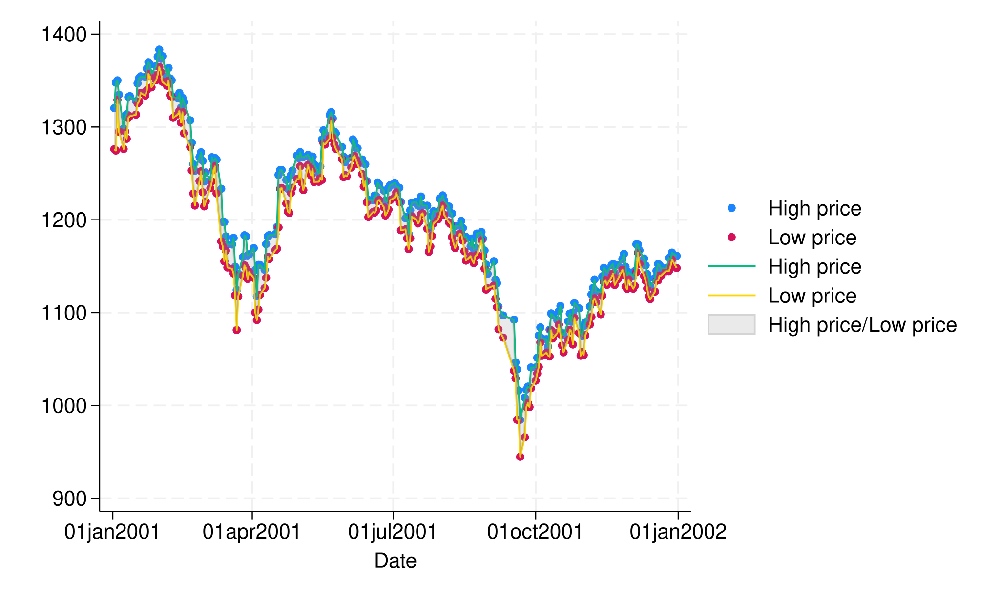

In [4]:
%%stata -qui
// new default scheme stcolor
sysuse sp500, clear
twoway scatter high low date      ||    ///
         line    high low date,   ||    ///
         rarea   high low date, color(gray%20)

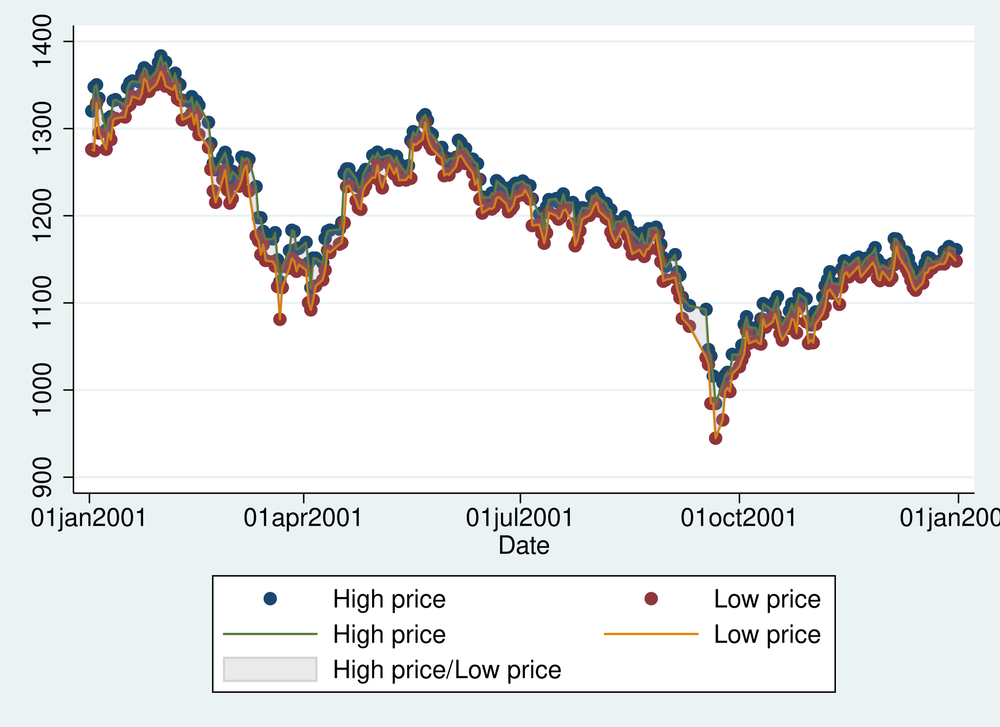

In [5]:
%%stata -qui
// old default scheme s2color
sysuse sp500, clear
twoway scatter high low date      ||    ///
    line    high low date,        ||    ///
    rarea   high low date, color(gray%20)   ///
    scheme(s2color)    

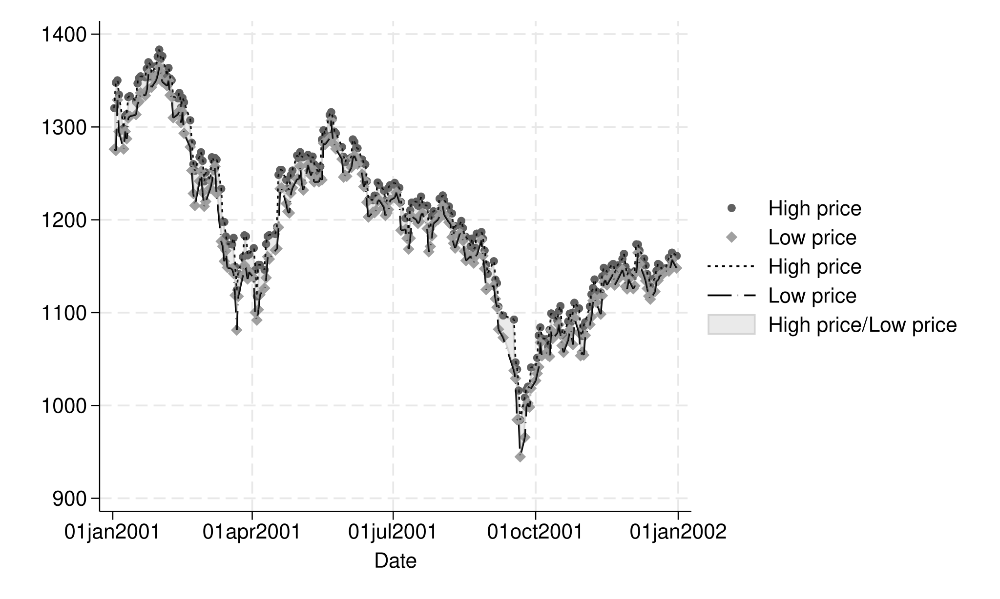

In [6]:
%%stata -qui
// new grey style scheme stmono2
sysuse sp500, clear
twoway scatter high low date      ||    ///
        line    high low date,    ||    ///
        rarea   high low date, color(gray%20) /// 
        scheme(stmono2)

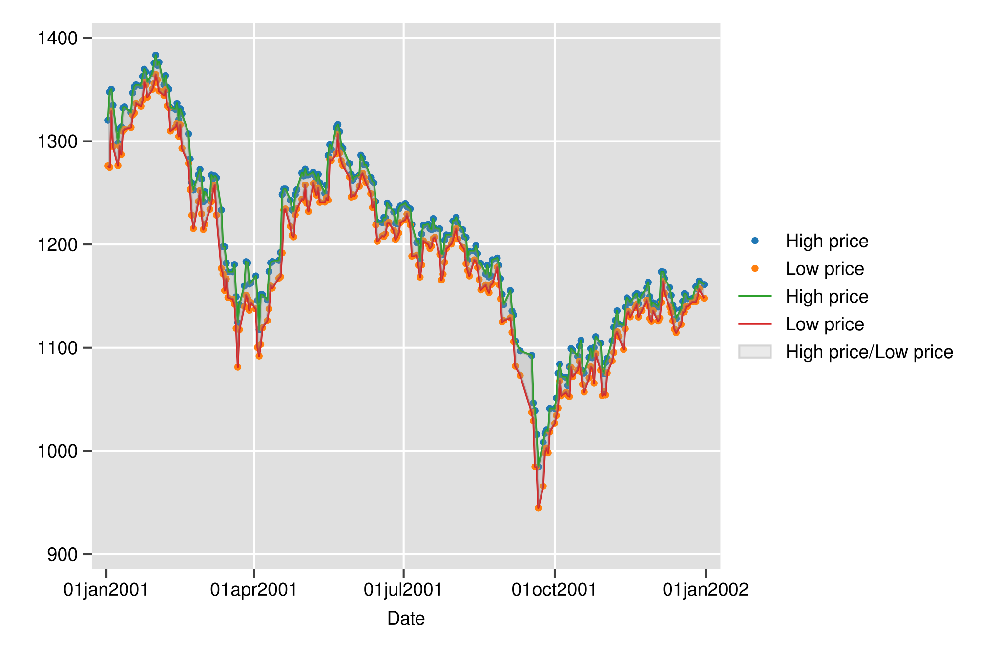

In [7]:
%%stata -qui
// requires user-written schemepack 
// https://github.com/asjadnaqvi/stata-schemepack
sysuse sp500, clear
twoway scatter high low date      ||    ///
         line    high low date,   ||                ///
         rarea   high low date, color(gray%20)      ///
         scheme(gg_tableau)

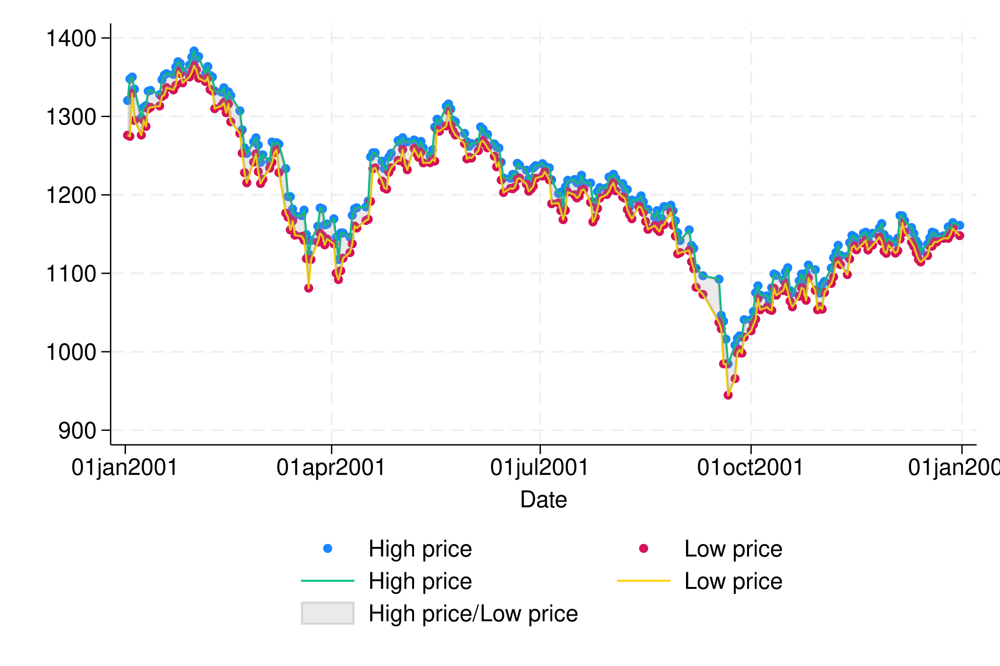

In [8]:
%%stata -qui
// new scheme stcolor_alt
sysuse sp500, clear
twoway scatter high low date      ||    ///
         line    high low date,   ||                ///
         rarea   high low date, color(gray%20)      ///
         scheme(stcolor_alt)

## More examples with stcolor scheme 

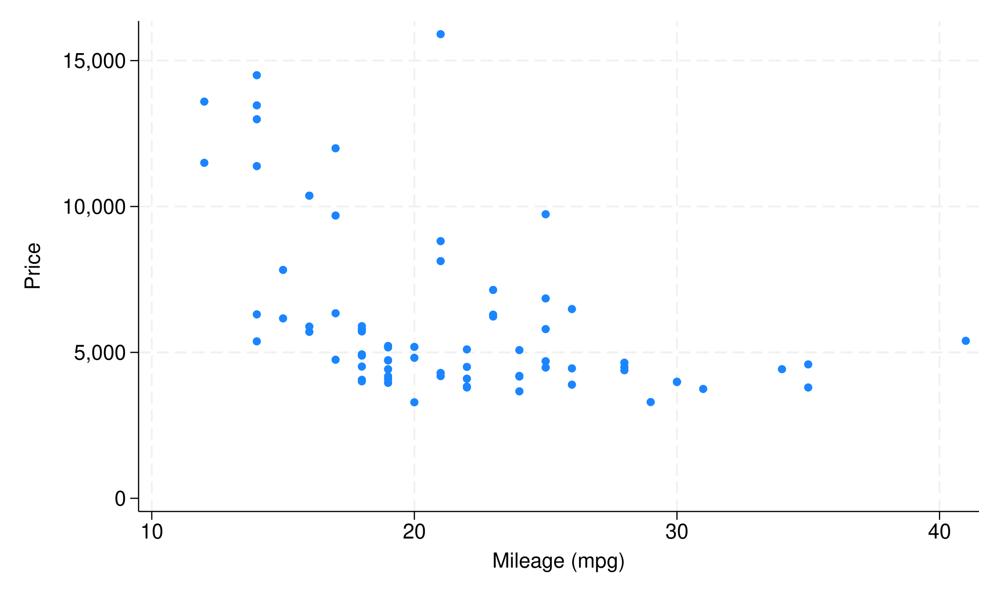

In [9]:
%%stata -qui
// twoway scatter 
sysuse auto, clear
sc price mpg

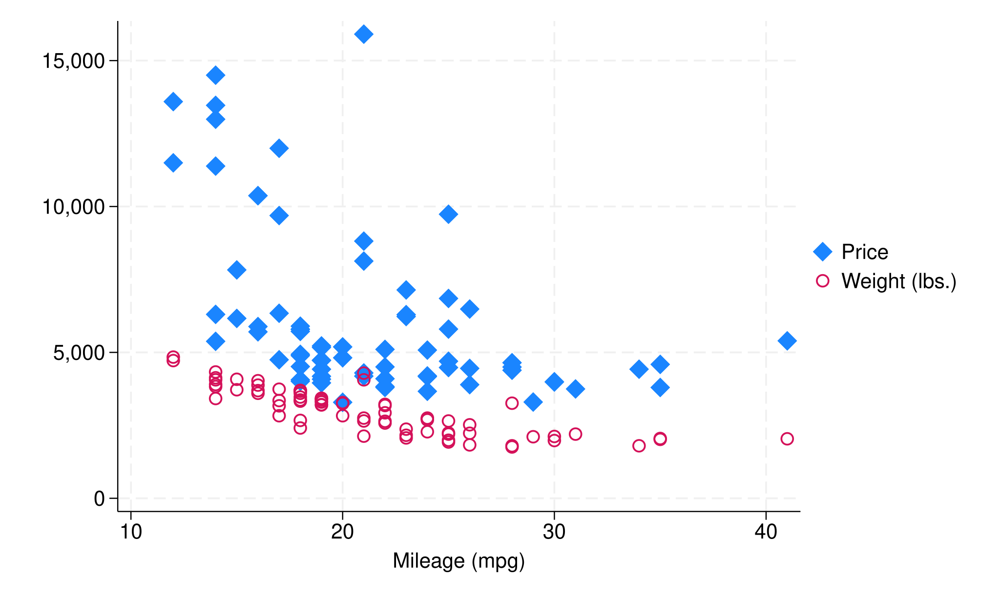

In [10]:
%%stata -qui
// overlay twoway plots
sysuse auto, clear
twoway (scatter price mpg, msymbol(D) msize(2))    ///
    (scatter weight mpg, msymbol(Oh) msize(medlarge)) 

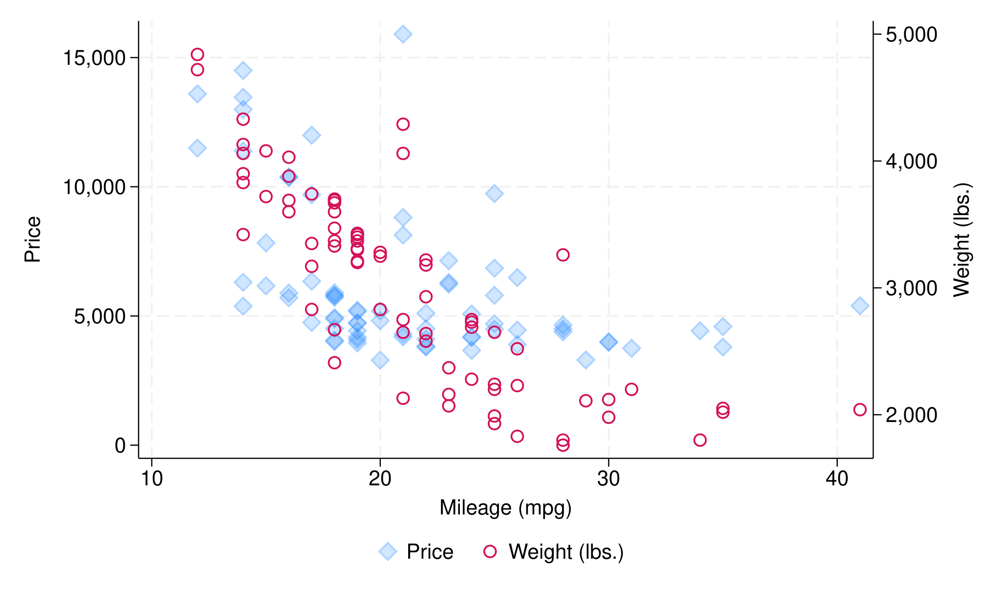

In [11]:
%%stata -qui
// overlay variables with different scales
sysuse auto, clear
twoway (scatter price mpg, msymbol(D) msize(2) mcolor(%20) yaxis(1) )     ///
     (scatter weight mpg, msymbol(Oh) msize(medlarge) yaxis(2))           ///
    , legend(pos(6) rows(1)) 

## List graph styles and schemes 

In [12]:
%%stata
graph query


Styles used in graph options are

    addedlinestyle      functiontypestyle   orientationstyle
    alignmentstyle                           
    anglestyle          gridstyle           pstyle
    areastyle                                
    arrowstyle          hrulestyle          ringposstyle
    arrowdirstyle                            
                        justificationstyle  sizetypestyle
    bystyle                                 sunflowertypestyle
                        legendstyle         symbolstyle
    clegendstyle        linestyle            
    clockposstyle       linealignmentstyle  textboxstyle
    colorstyle          linepatternstyle    textsizestyle
    compassdirstyle     linewidthstyle      tickstyle
    connectstyle                             
                        marginstyle         zyx2style
    fpcolstyle          markerstyle         zyx2rulestyle
    fpcolnamestyle      markerlabelstyle    zyx2typestyle
    fpgraphstyle        markersizestyle
    functi

In [13]:
%%stata
graph query color


colorstyle may be

    538axis        538rs9         gs0            navy8          stblue
    538b           538t           gs1            none           stc1
    538background  538y           gs10           olive          stc10
    538bs1         ananas         gs11           olive_teal     stc11
    538bs10        black          gs12           orange         stc12
    538bs11        blue           gs13           orange_red     stc13
    538bs2         bluishgray     gs14           orangebrown    stc14
    538bs3         bluishgray8    gs15           pink           stc15
    538bs4         brown          gs16           plb1           stc2
    538bs5         chocolate      gs2            plb2           stc3
    538bs6         cranberry      gs3            plb3           stc4
    538bs7         cyan           gs4            plg1           stc5
    538bs8         dimgray        gs5            plg2           stc6
    538bs9         dkgreen        gs6            plg3           stc7
    53

("stc1" = "26    133    255"%100, "stc2" = "212   17      89"%100)


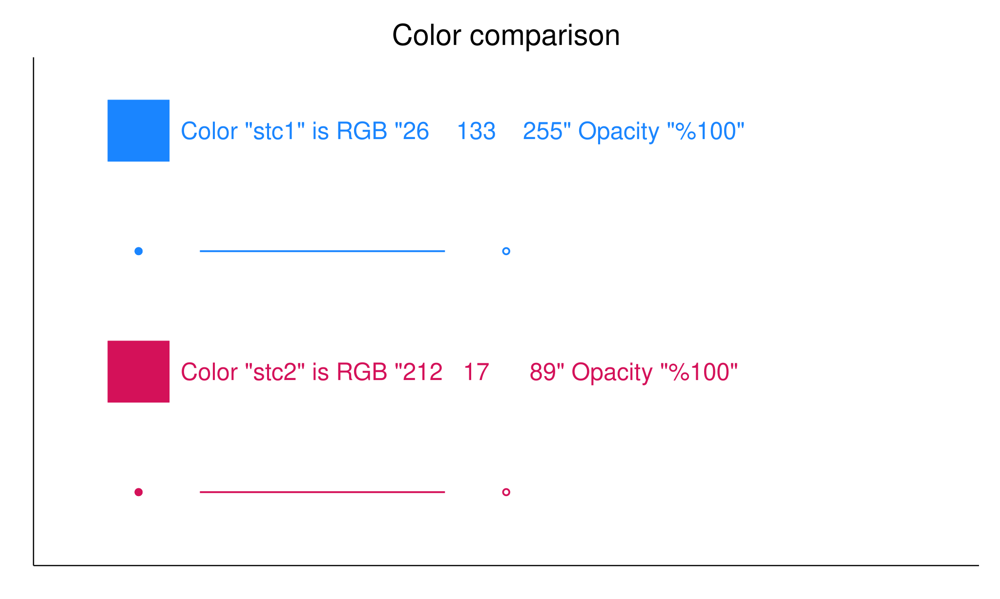

In [14]:
%%stata
palette color stc1 stc2

## More examples

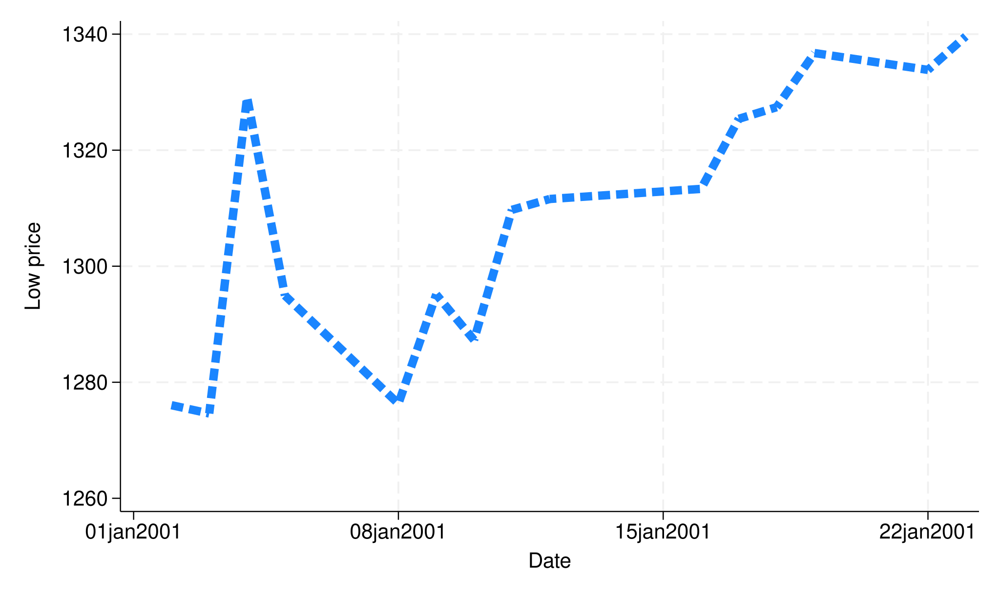

In [15]:
%%stata -qui
// twoway line
sysuse sp500, clear
twoway line low date in 1/15    ///
      , lpattern(dash) lwidth(vthick)

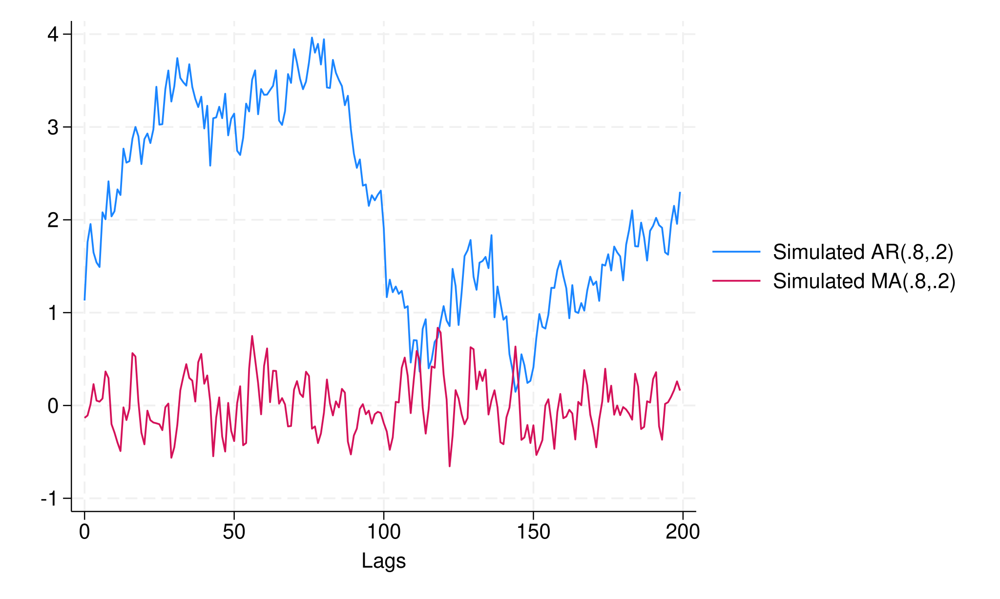

In [16]:
%%stata -qui
// twoway tsline
use https://www.stata-press.com/data/r18/tsline1, clear
tsset lags
twoway tsline ar ma

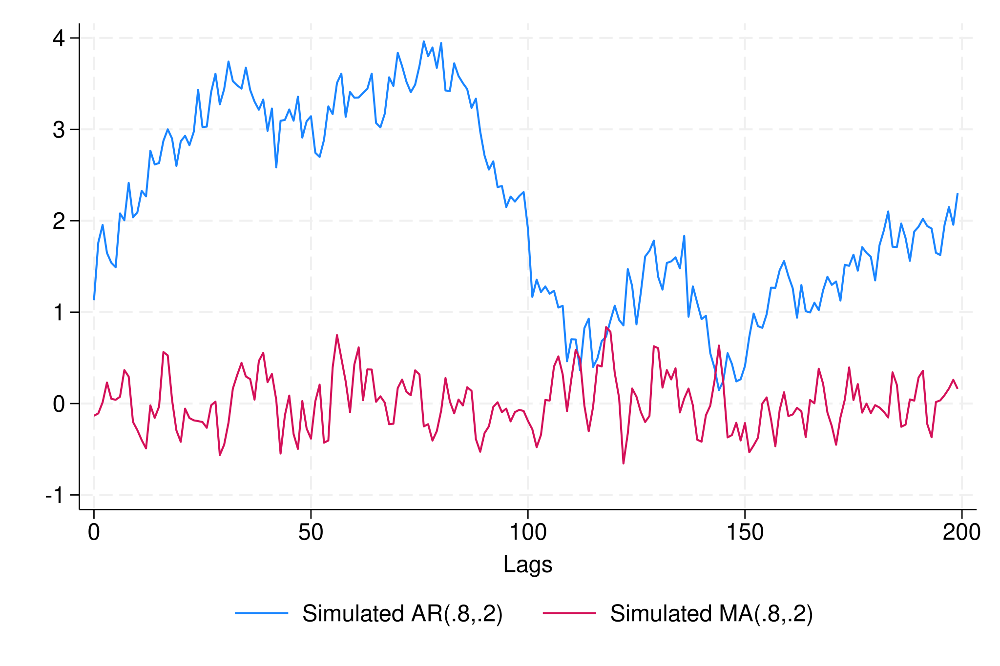

In [17]:
%%stata -qui
use https://www.stata-press.com/data/r18/tsline1, clear
tsset lags
// same as twoway tsline ar ma, scheme(stcolor_alt)
tsline ar ma

In [18]:
%%stata -qui
graph query, schemes

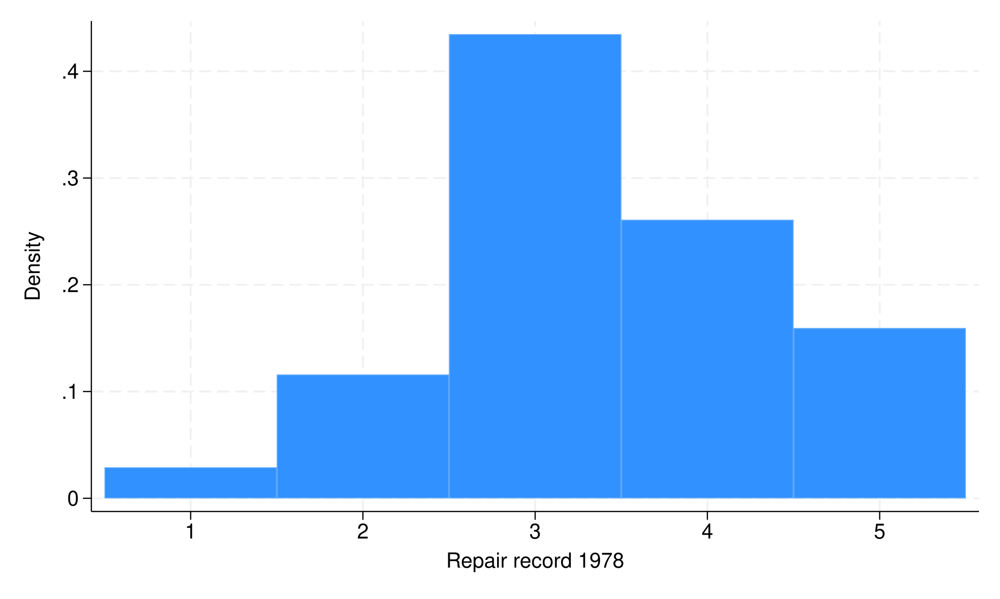

In [19]:
%%stata -qui
// twoway histogram
sysuse auto, clear
twoway histogram rep78, discrete

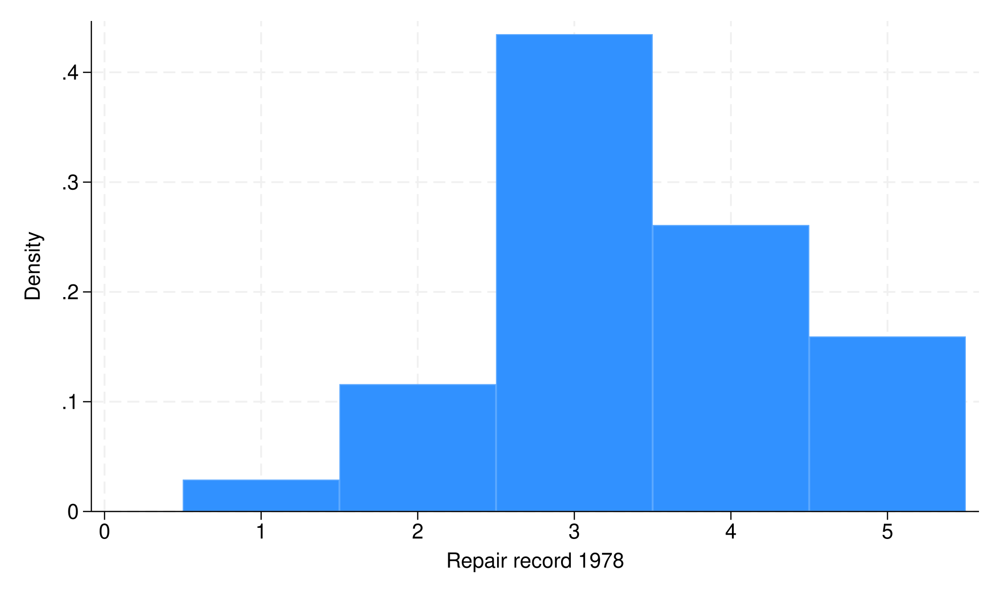

In [20]:
%%stata -qui
// histogram
sysuse auto, clear
histogram rep78, discrete

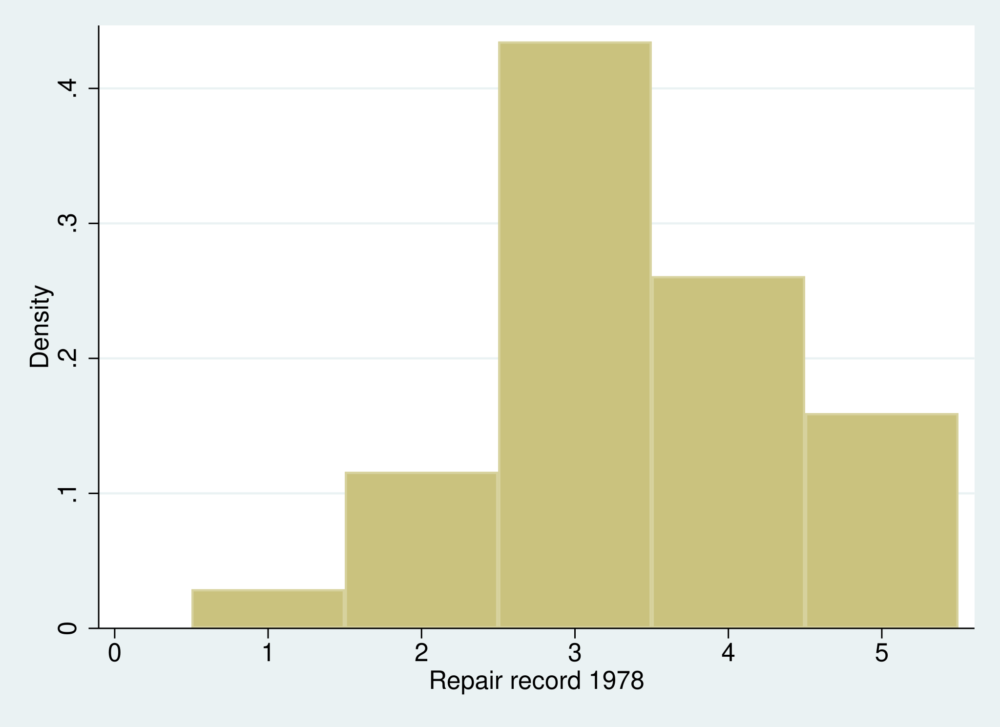

In [21]:
%%stata -qui
// histogram with old default scheme
sysuse auto, clear
histogram rep78, discrete scheme(s2color)

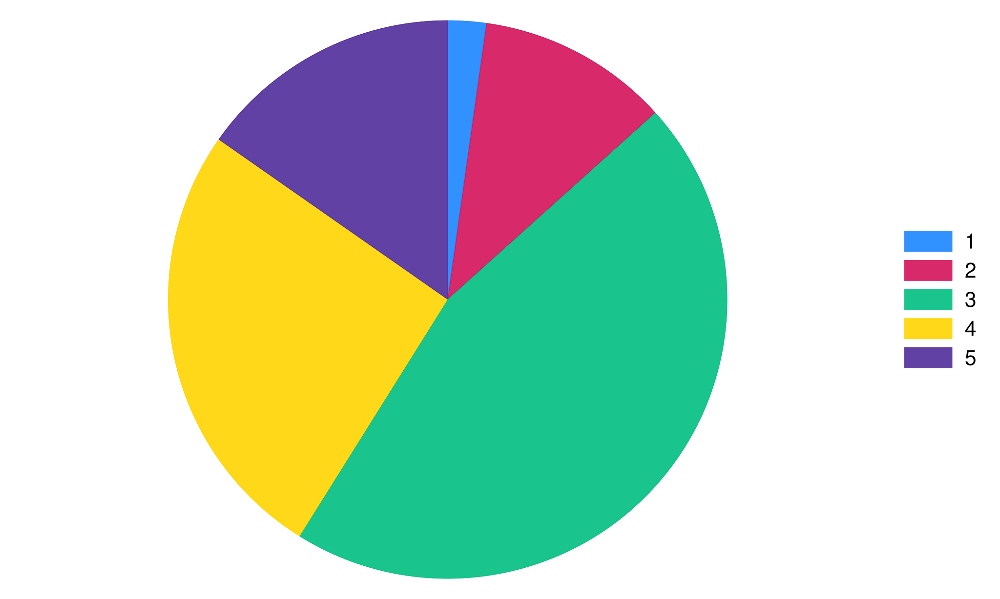

In [22]:
%%stata -qui
// graph pie
sysuse auto, clear
graph pie price, over(rep78)

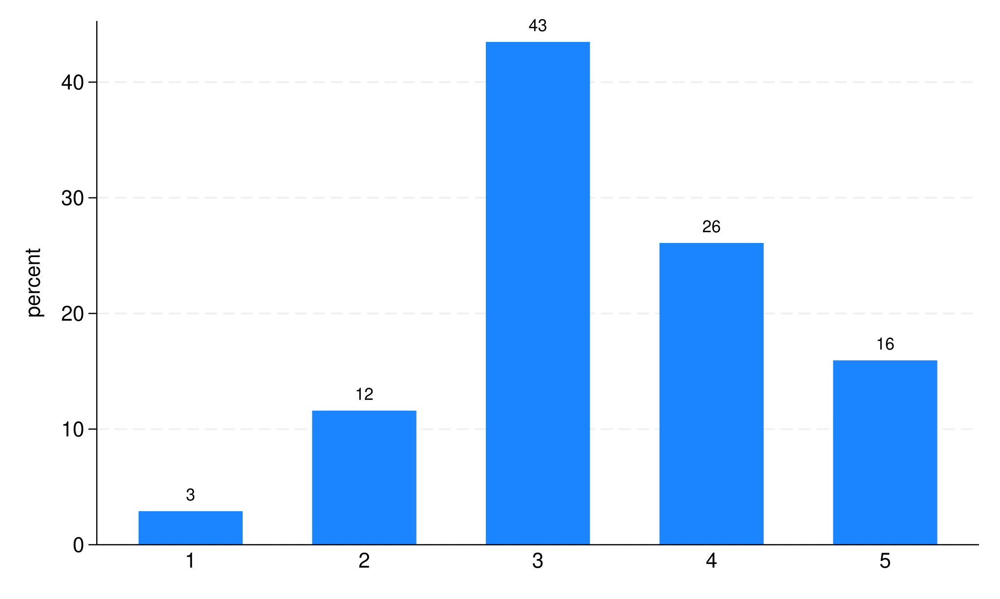

In [23]:
%%stata -qui
// graph bar, default stat is percent
sysuse auto, clear
graph bar, over(rep78) blabel(bar, format(%4.0f))

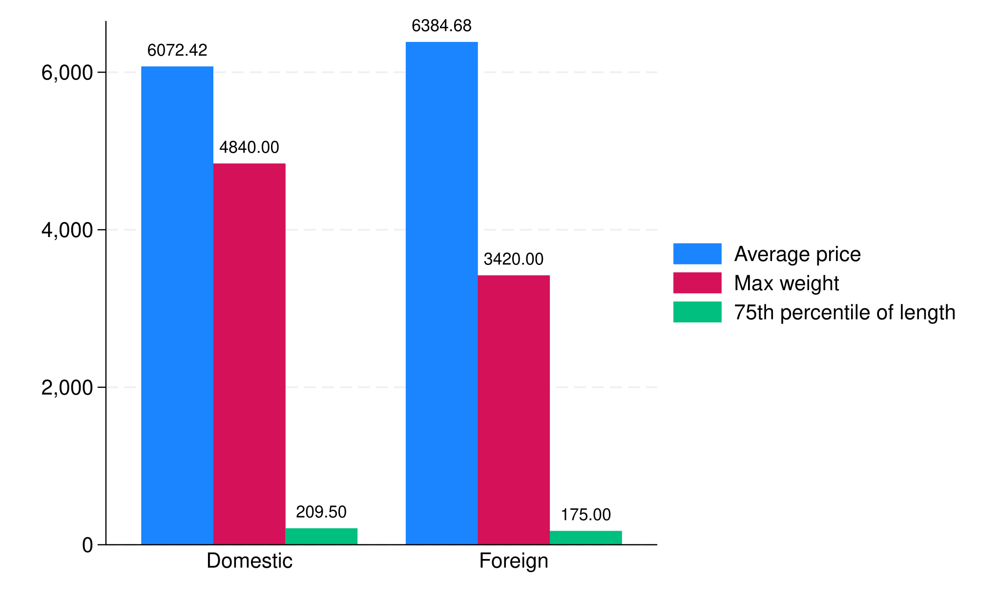

In [24]:
%%stata -qui
// graph bar, stat mean, min, and max 
sysuse auto, clear
graph bar (mean) price (max) weight (p75) length, /// 
    over(foreign) ///
    blabel(bar, format(%4.2f)) ///
    legend(order(1 "Average price" 2 "Max weight" 3 "75th percentile of length"))

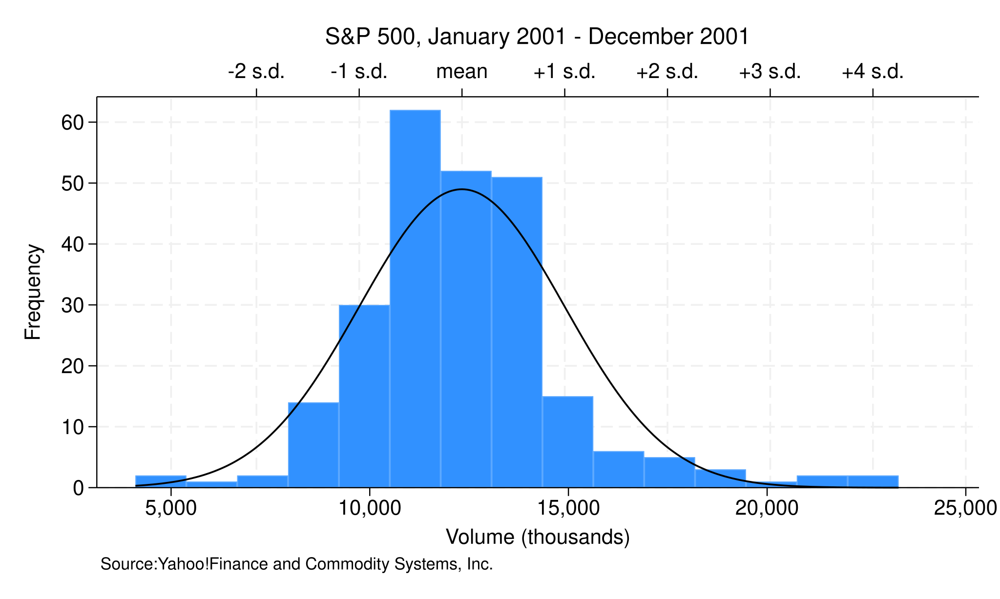

In [25]:
%%stata -qui
// histogram
sysuse sp500, clear
histogram volume, freq normal                ///
    xaxis(1 2) ylabel(0(10)60, grid)         ///
    xlabel(, nogrid) xline(5000 25000, lstyle(major_grid))              ///
    xlabel(12321 "mean" 9735 "-1 s.d."       ///
        14907 "+1 s.d." 7149 "-2 s.d."       ///
        17493 "+2 s.d." 20078 "+3 s.d."      ///
        22664 "+4 s.d.", axis(2) grid gmax)  xtitle("", axis(2)) ///
        subtitle("S&P 500, January 2001 - December 2001")        ///
        note("Source:Yahoo!Finance and Commodity Systems, Inc.")


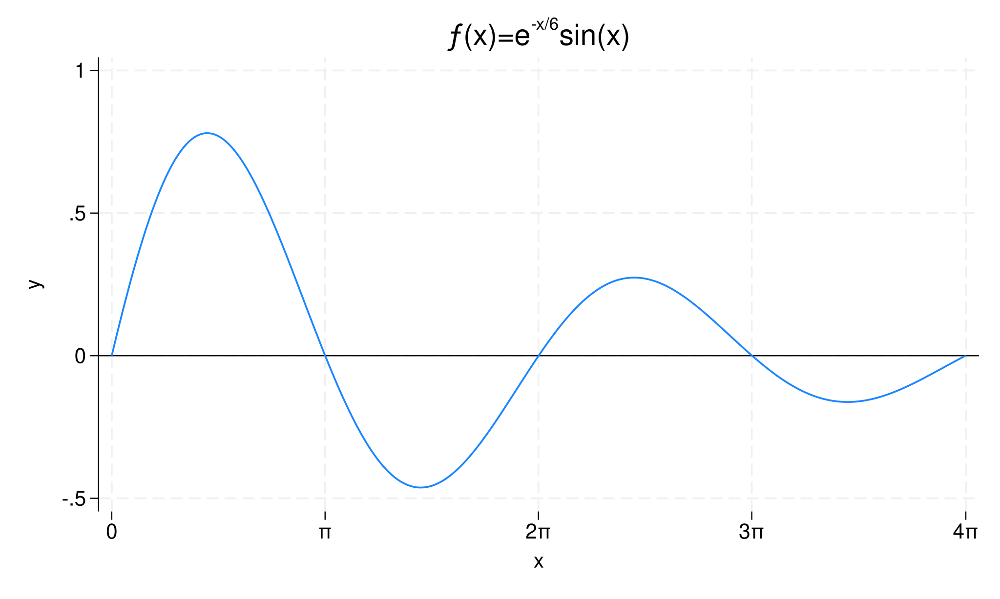

In [26]:
%%stata -qui
// twoway function, Greek letter and math symbols
// -help graph text-
twoway function y=exp(-x/6)*sin(x), range(0 12.57)  ///
                yline(0, lstyle(foreground))  ///
                xlabel( 0                ///
                        3.14 "{&pi}"     ///
                        6.28 "2{&pi}"    ///
                        9.42 "3{&pi}"    ///
                       12.57 "4{&pi}")   ///
                plotregion(style(none))  ///
                xsca(noline)             ///
                title("{&function}(x)=e{superscript:-x/6}sin(x)")

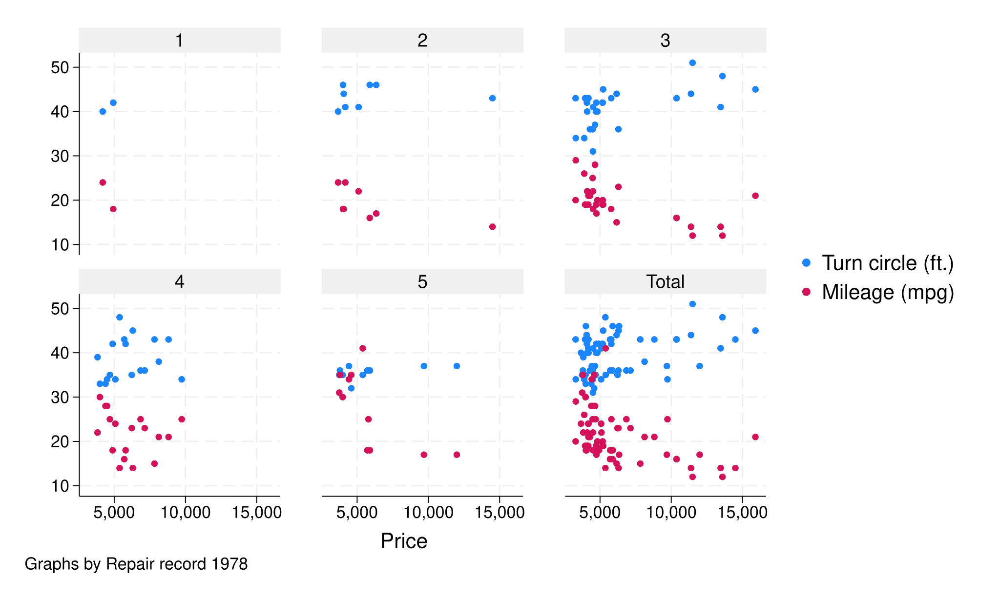

In [27]:
%%stata -qui
// subplots with by
sysuse auto, clear
twoway scatter turn mpg price, by(rep78, cols(3) total)

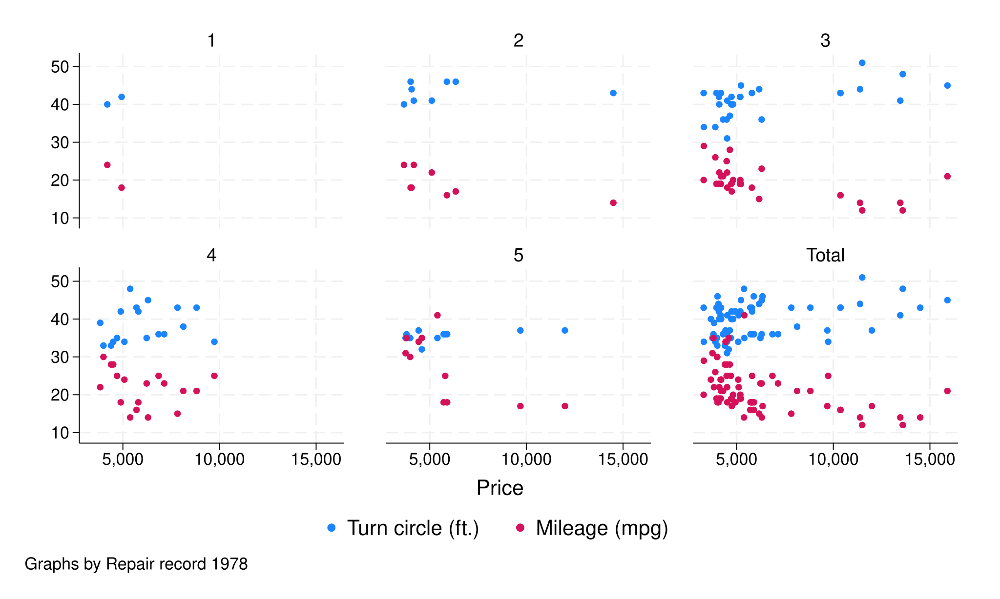

In [28]:
%%stata -qui
// subplots with by, change legend position and subtitle background
sysuse auto, clear
twoway scatter turn mpg price, by(rep78, cols(3) total legend(pos(6)))   ///
     legend(rows(1)) subtitle(, bcolor(white))

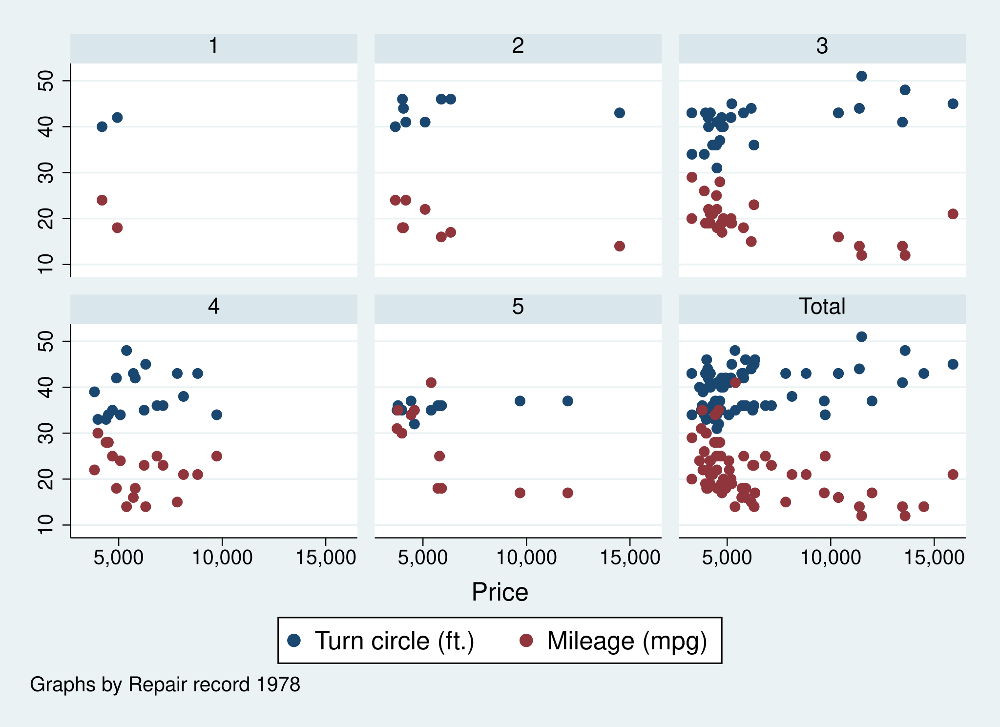

In [29]:
%%stata -qui
// subplots with by, old scheme
sysuse auto, clear
twoway scatter turn mpg price, by(rep78, cols(3) total) scheme(s2color)

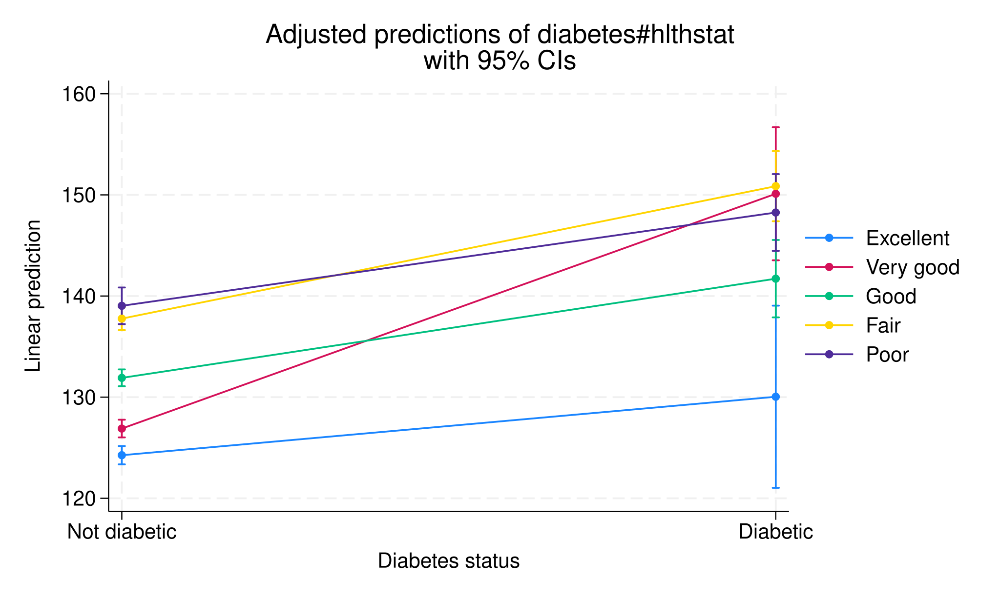

In [30]:
%%stata -qui
// marginsplot
webuse nhanes2l, clear
// fit a linear regression model using the continuous outcome variable bpsystol, 
// the binary predictor variable diabetes, and the categorical predictor variable hlthstat.
regress bpsystol i.hlthstat##i.diabetes

// estimate marginal predictions of SBP for each 
// combination of the categories of hlthstat and diabetes.
margins diabetes#hlthstat

// profile plot shows a separate line for each category of hlthstat
marginsplot, title("Adjusted predictions of diabetes#hlthstat" "with 95% CIs")  

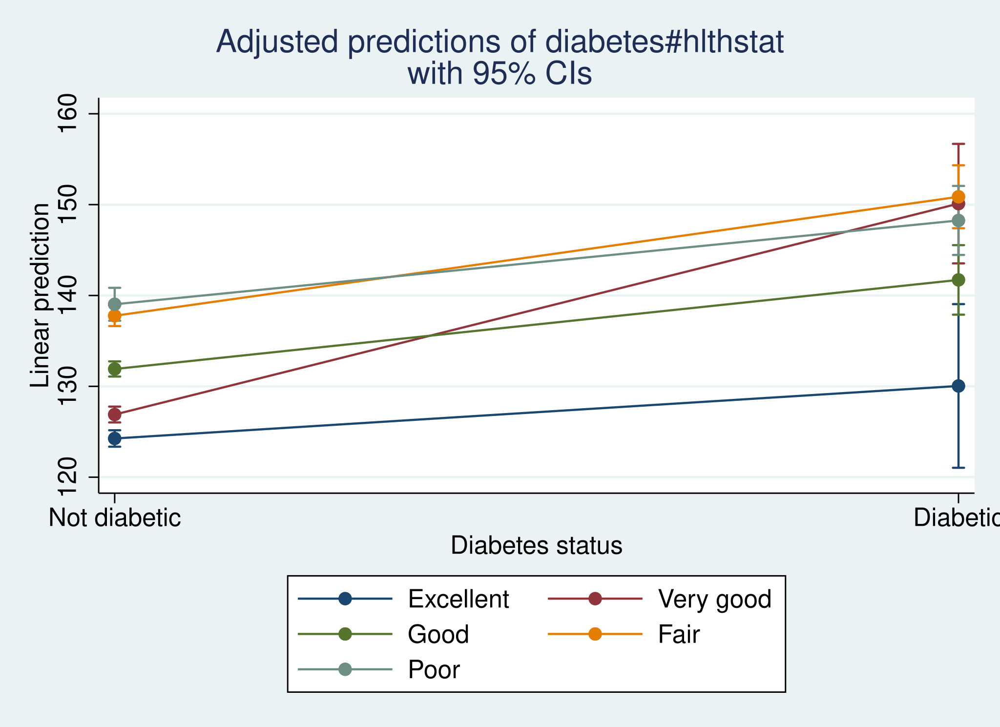

In [31]:
%%stata -qui
margins diabetes#hlthstat
marginsplot, title("Adjusted predictions of diabetes#hlthstat" "with 95% CIs") /// 
   scheme(s2color)

## Change color, size, pattern, size, legend, and other graph styles

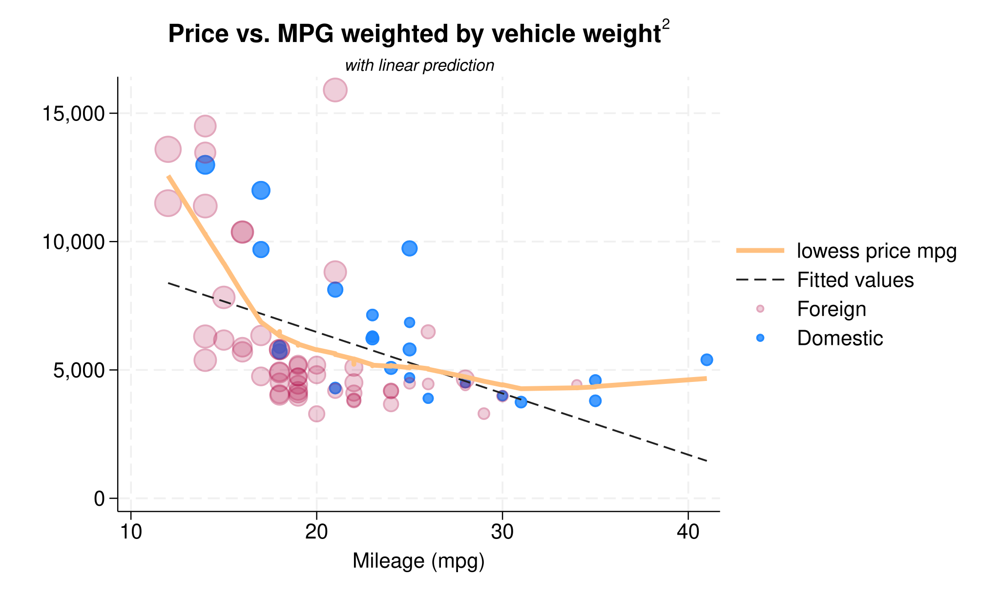

In [32]:
%%stata -qui
sysuse auto, clear
generate int wgt2 = (weight / 1000) ^ 2
twoway  (scatter price mpg if foreign [aw = wgt2], mcolor(%80))      /// 
    (scatter price mpg if !foreign [aw = wgt2], mcolor(%20*1.2))     /// 
    (lfit price mpg, lcolor(gs2) lpattern(dash))                     ///
    (lowess price mpg, lcolor("255 128 0*0.5") lwidth(thick))        /// 
    , legend(order(4 3 2 "Foreign" 1 "Domestic"))                    ///
    title("{bf:Price vs. MPG weighted by vehicle weight}{superscript:2}", size(medlarge))  ///
    subtitle("{it}with linear prediction", size(2.75))

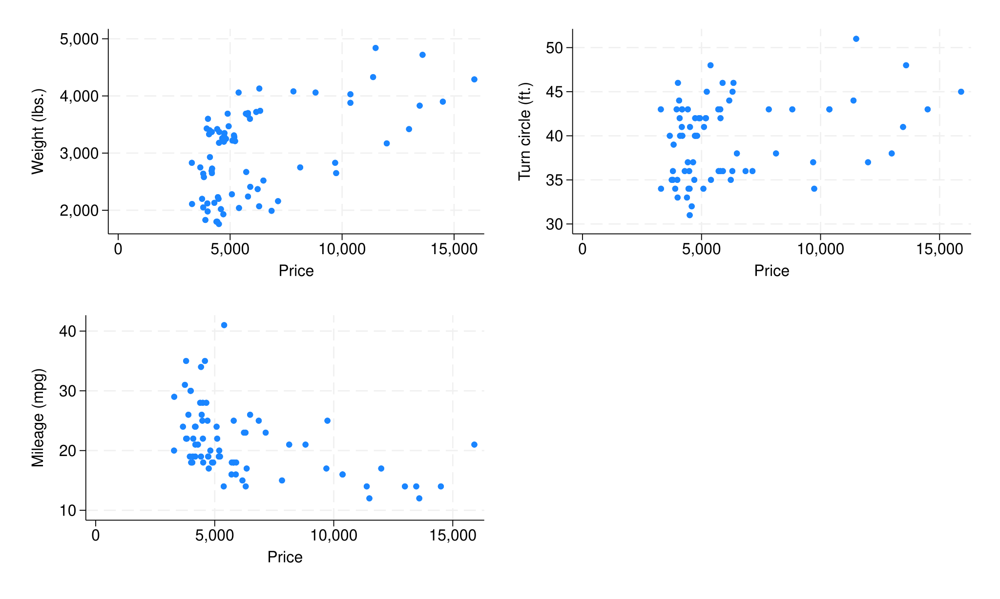

In [33]:
%%stata -qui
// graph combine, note the misalignment of y axes 
sysuse auto, clear
scatter weight price, name(g1, replace) nodraw
scatter turn price, name(g2, replace) nodraw
scatter mpg price, name(g3, replace) nodraw
graph combine g1 g2 g3

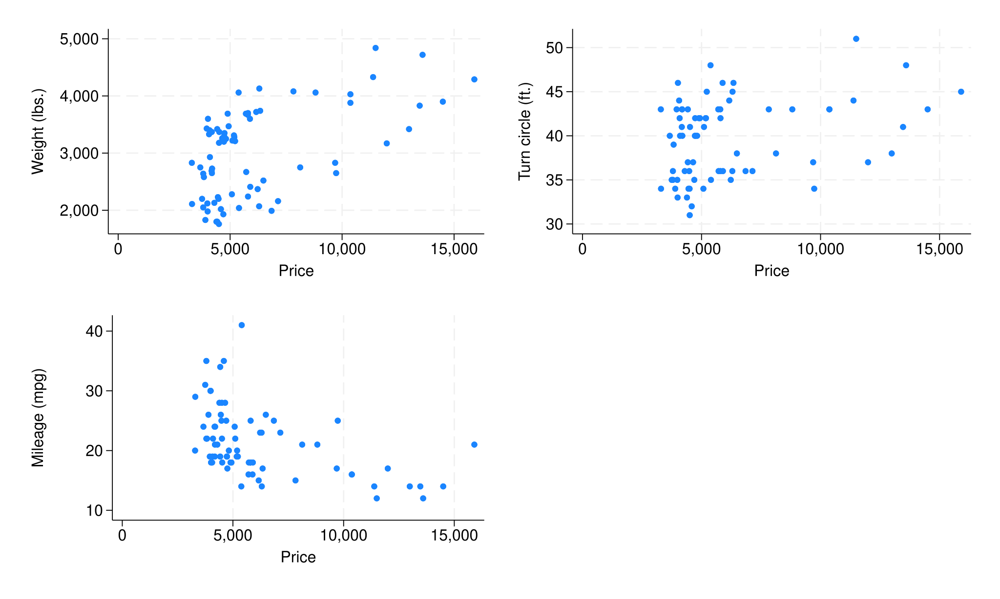

In [34]:
%%stata -qui
// use labelminlen to improve y-axis alignment
scatter mpg price, name(g3, replace) ylabel(, nogrid  labelminlen(5)) nodraw
graph combine g1 g2 g3

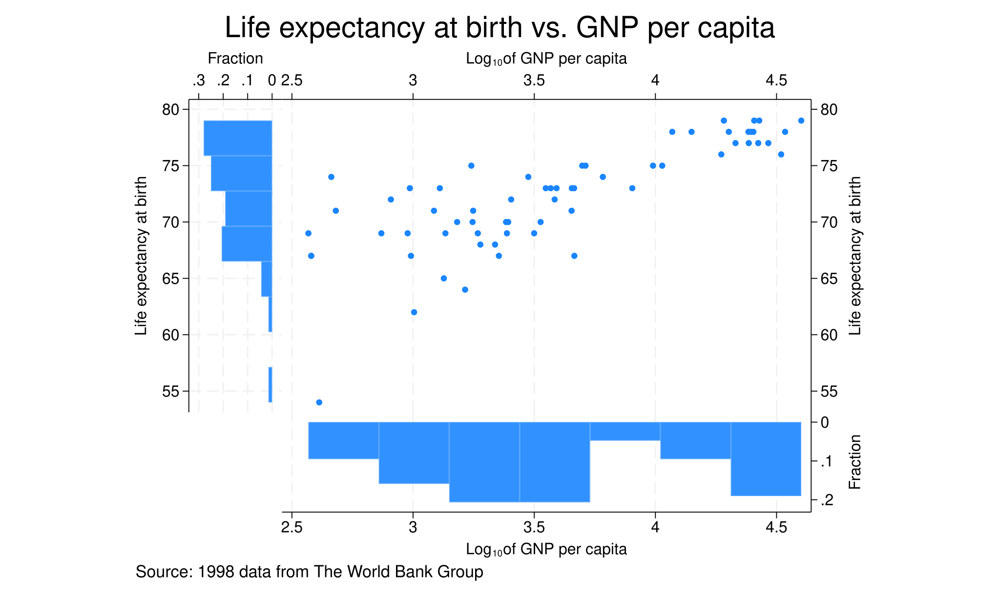

In [35]:
%%stata -qui
// graph combine, alternate axes and axis label length
sysuse lifeexp, clear
generate loggnp = log10(gnppc)
label var loggnp "Log{subscript:10} of GNP per capita"
scatter lexp loggnp, ysca(alt) xsca(alt) ylabel(, nogrid) /// 
    xlabel(, grid gmax) name(yx, replace) nodraw 
twoway histogram lexp, fraction xsca(alt reverse) horiz  /// 
    fxsize(25) name(hy, replace) nodraw
twoway histogram loggnp, fraction ysca(alt reverse)   /// 
    ylabel(0(.1).2, nogrid labelminlen(2)) xlabel(,grid gmax)  ///
    fysize(25) name(hx, replace) nodraw
graph combine hy yx hx, hole(3)  /// 
    imargin(0 0 0 0) graphregion(margin(l=22 r=22)) /// 
    title("Life expectancy at birth vs. GNP per capita") /// 
    note("Source: 1998 data from The World Bank Group")

## Use levels of a variable to control color

When we create a **twoway** plot with numeric variables **y** and **x**, it is often useful to colorcode the plot based on values of another variable. This allows us to see how the relationship between **y** and **x** differs for each level of the third variable. 


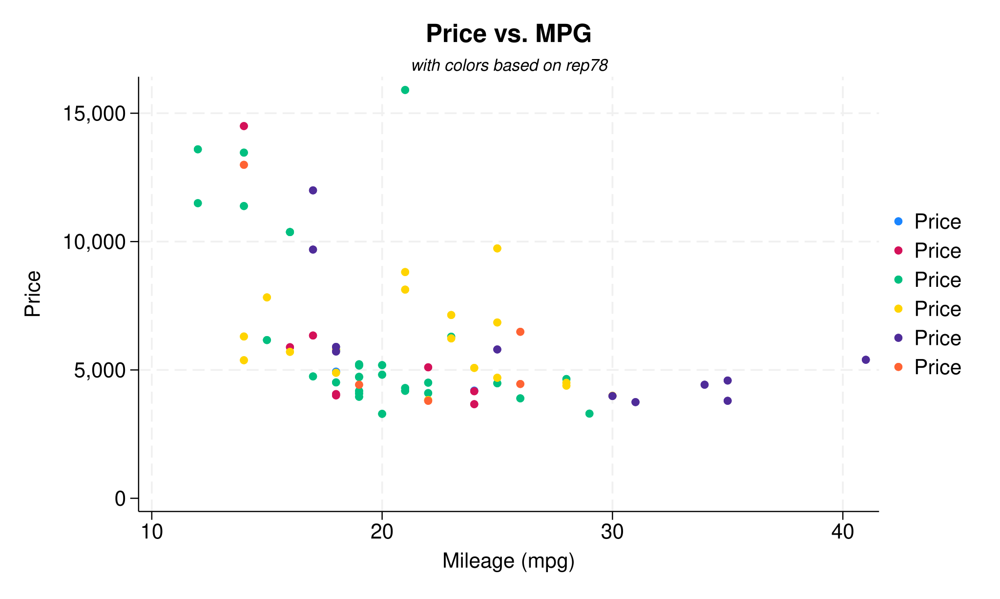

In [36]:
%%stata -qui
// overlay many graphs
sysuse auto, clear
label define repair 1 "Excellent" 2 "Good" 3 "Average" 4 "Fair" 5 "Poor"
label values rep78 repair 
twoway  (scatter price mpg if rep78 == 1)    /// 
        (scatter price mpg if rep78 == 2)    ///
        (scatter price mpg if rep78 == 3)    ///
        (scatter price mpg if rep78 == 4)    ///
        (scatter price mpg if rep78 == 5)    ///
        (scatter price mpg if missing(rep78))    ///
    , title("{bf:Price vs. MPG}", size(medlarge))  ///
    subtitle("{it}with colors based on rep78", size(2.75))

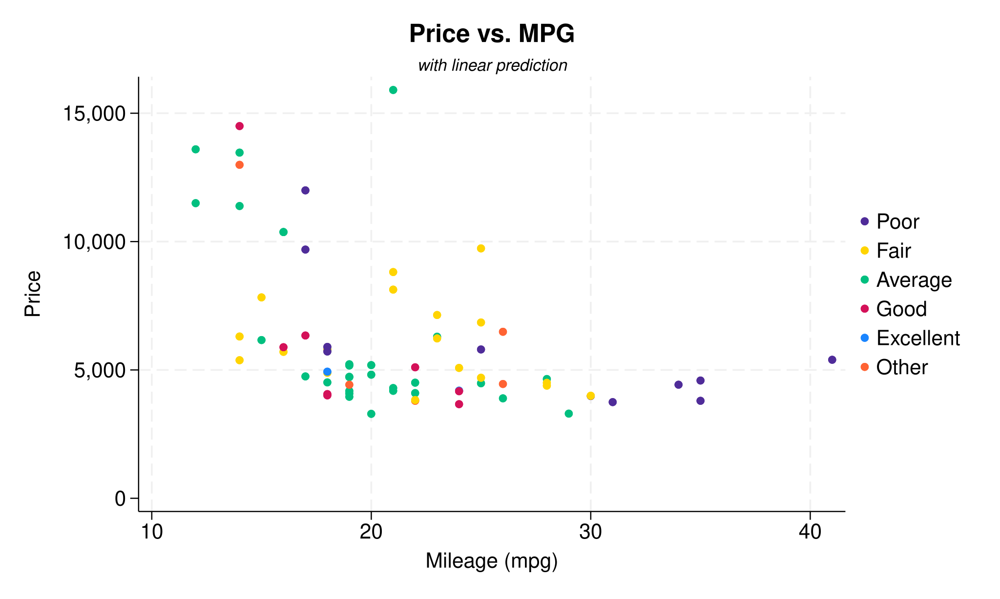

In [37]:
%%stata -qui
sysuse auto, clear
label define repair 1 "Excellent" 2 "Good" 3 "Average" 4 "Fair" 5 "Poor"
label values rep78 repair 
twoway scatter price mpg, colorvar(rep78)        ///
    colordiscrete coloruseplegend                ///
    colorrule(phue) colorformissing(stc6)        ///
    zlabel(, valuelabel)                         ///
    title("{bf:Price vs. MPG}", size(medlarge))  ///
    subtitle("{it}with linear prediction", size(2.75))

## *colorvar()* and related options

* **colorvar**(_colorvar_): specify variable to control color
* **colordiscrete**: treat _colorvar_ as discrete instead of continuous
* **colorcuts**(*numlist*): specify list of cuts for _colorvar_
* **colorlevels**(*#*): specify number of levels for _colorvar_
* **colorvarminmax**: include min and max of _colorvar_ in the list of cuts created by __colorcuts()__ or __colorlevels()__
* **colorrule**(_[crule] [%# [*#]]_): specify rule for creating colors for levels of _colorvar_
* **colorstart**(_colorstyle_): specify starting color for __colorrule()__
* **colorend**(*colorstyle*): specify ending color for __colorrule()__
* **colorlist**(*colorstylelist*): specify list of colors for each level of _colorvar_
* **colorfillonly**: specify that the color for items based on _colorvar_ not affect the outline
* **colorformissing**(*colorstyle*): specify the color for the level of missing values
* **colorkeysrange**: draw keys in legend as ranged bars
* **coloruseplegend**: use the contour-line plot legend instead of the contour plot legend

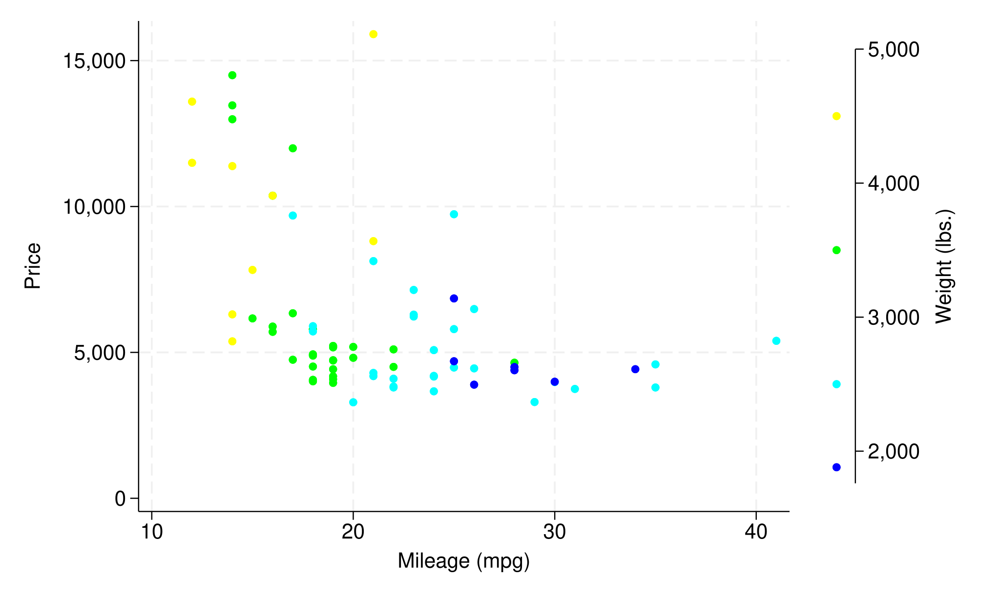

In [38]:
%%stata -qui
sysuse auto, clear
// colorvar as continuous variable

// the color of the markers is determined by the value of weight 
// the weight variable is partitioned into four levels 
// <=2000, (2000, 3000], (3000, 4000], and (4000, 5000] 
// the markers are colored based on the level to which they belong
                                            
twoway scatter price mpg, colorvar(weight)

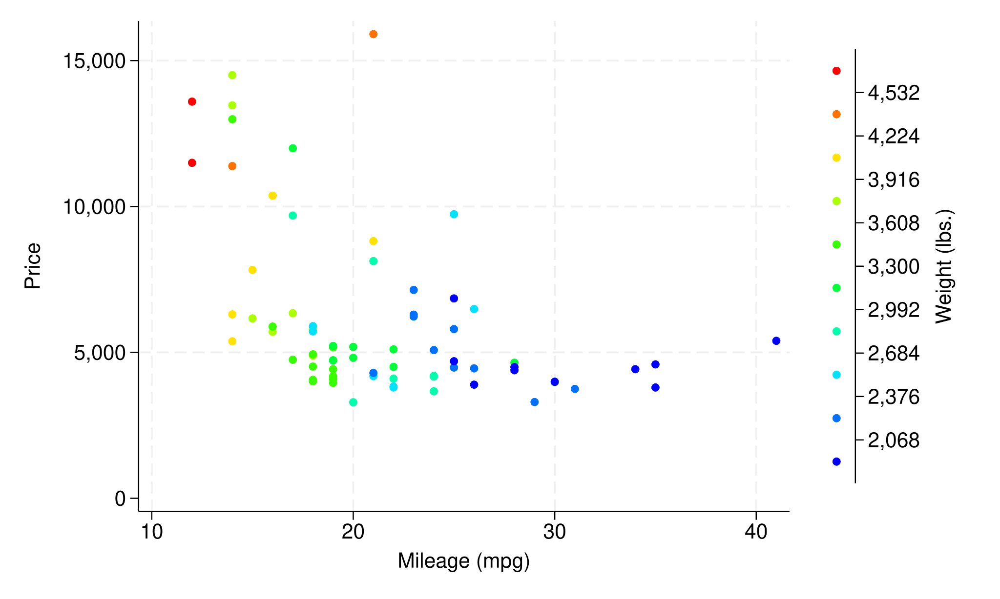

In [39]:
%%stata -qui
sysuse auto, clear
// 10 levels (9 cuts)
twoway scatter price mpg, colorvar(weight) colorlevels(10)

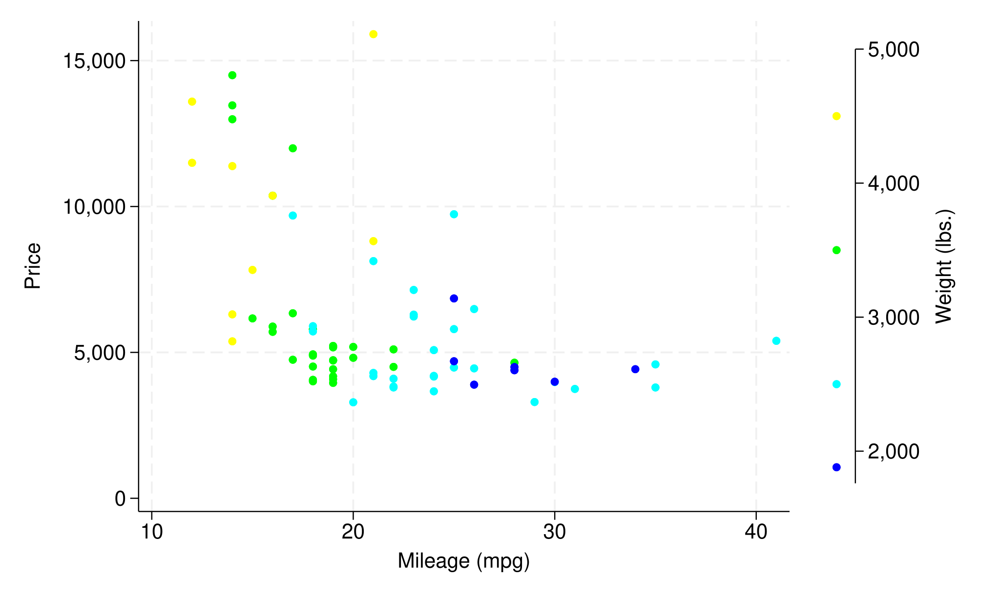

In [40]:
%%stata -qui
sysuse auto, clear
// specify cuts
twoway scatter price mpg, colorvar(weight) colorcuts(1000(1000)5000)

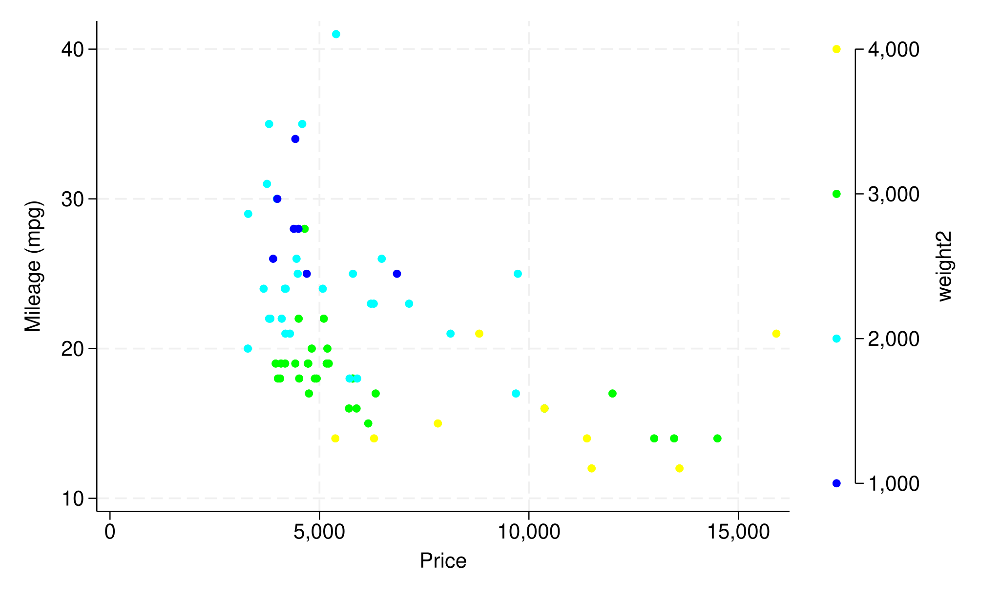

In [41]:
%%stata -qui
sysuse auto, clear
// colorvar as discrete variable
generate weight2 = int(weight / 1000) * 1000
// the levels are at the values equal to 1000, 2000, 3000, or 4000
twoway scatter mpg price, colorvar(weight2) colordiscrete

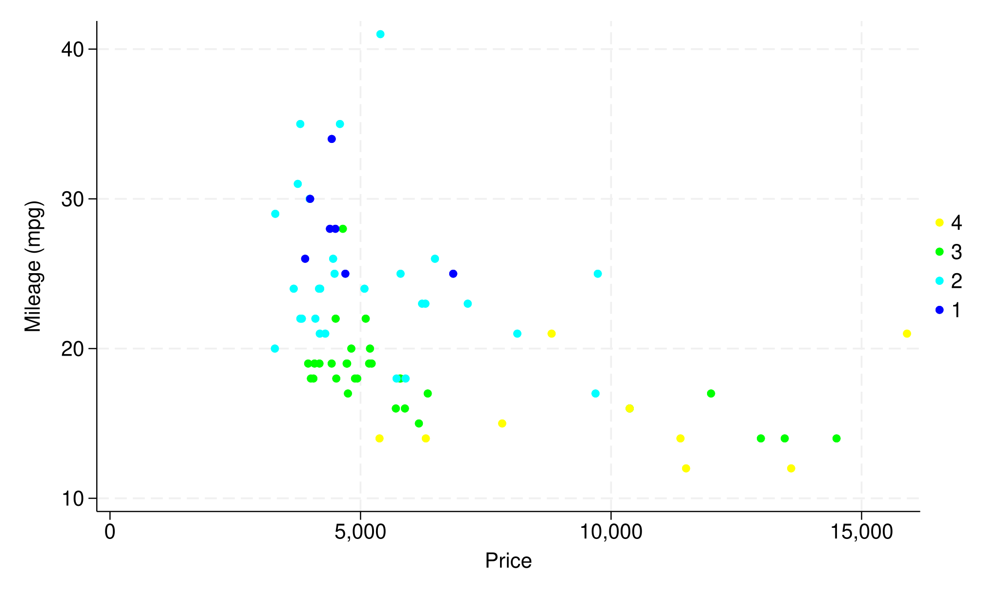

In [42]:
%%stata -qui
sysuse auto, clear
// plegend
generate byte weight_category = int(weight / 1000)
twoway scatter mpg price, colorvar(weight_category) /// 
   colordiscrete coloruseplegend

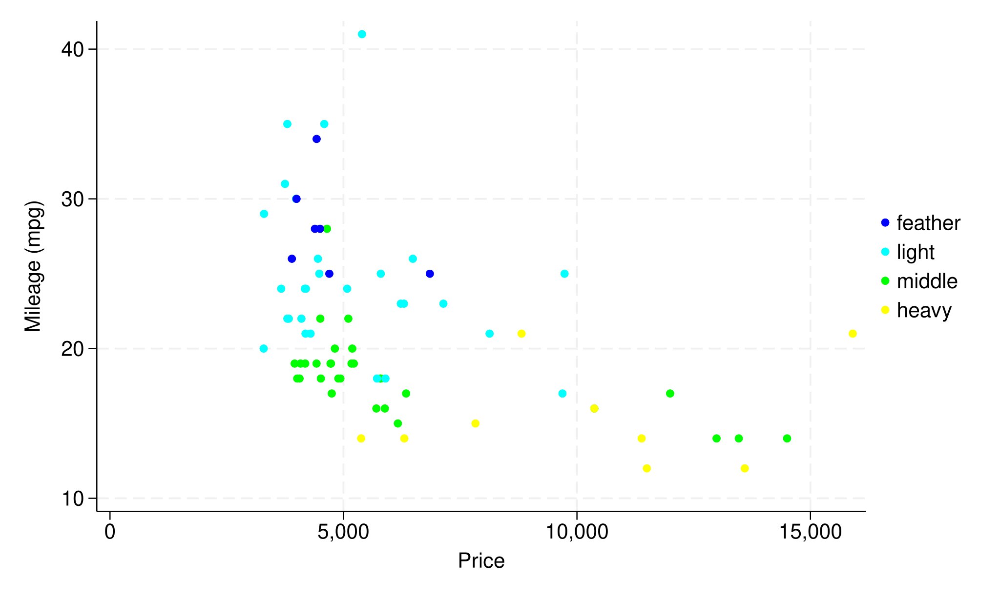

In [43]:
%%stata -qui
sysuse auto, clear
// use plegend instead of clegend
generate byte weight_category = int(weight / 1000)
twoway scatter mpg price, colorvar(weight_category) /// 
   colordiscrete coloruseplegend                    ///
   plegend(label(1 "heavy") label(2 "middle")       /// 
           label(3 "light") label(4 "feather")      ///
           order(4 3 2 1))    

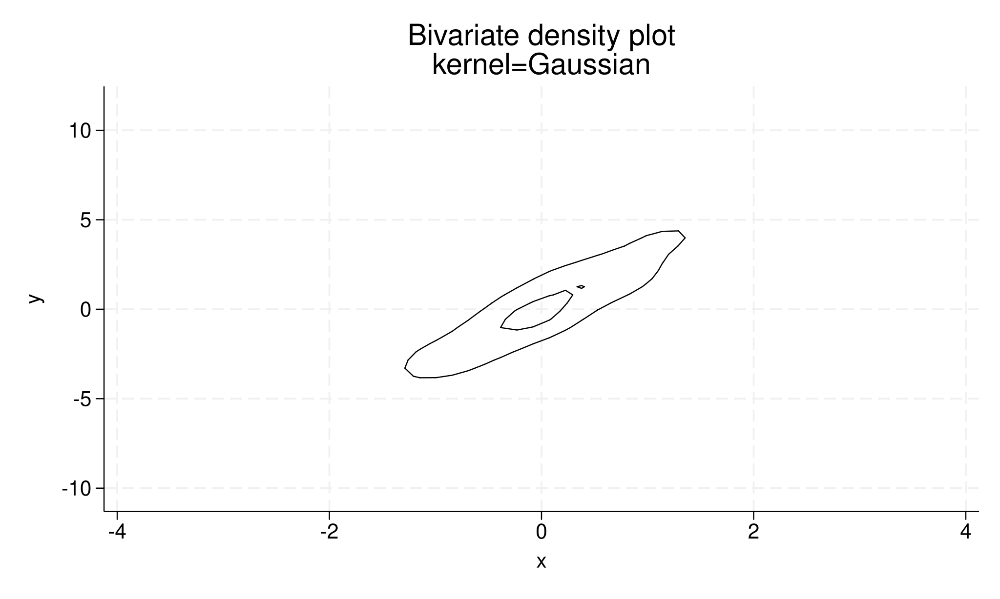

In [44]:
%%stata -qui
// requires user-written kdens2
capture ssc install kdens2
clear
set obs 1000
set seed 12345
generate x = rnormal()
generate y = x* 3 + rnormal()
kdens2 y x, saving(dens) replace

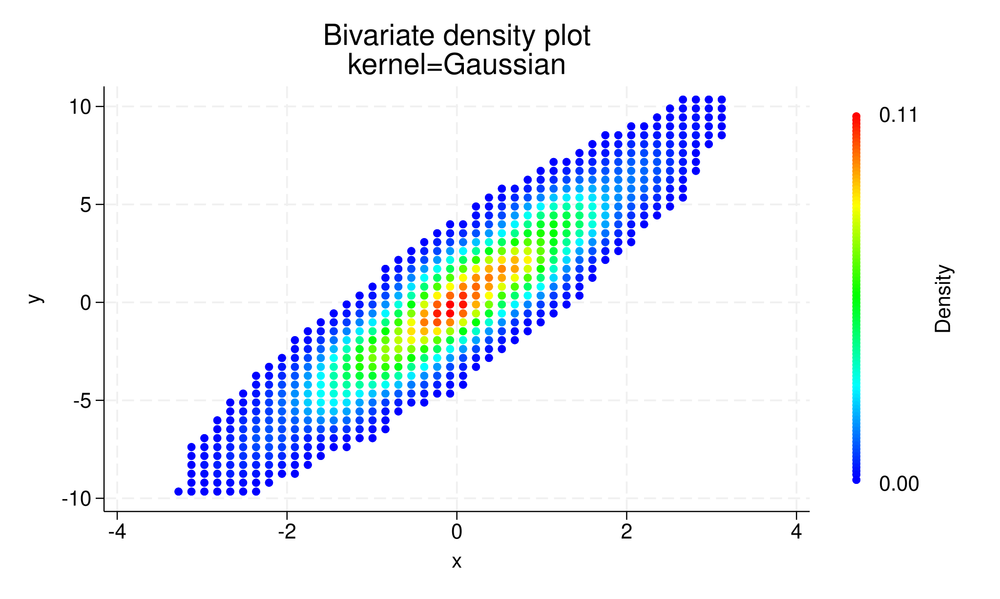

In [45]:
%%stata -qui
// large number of levels
use dens.dta, clear
rename _y y
rename _x x

sum d
local min = `r(min)'
local max = `r(max)'

twoway scatter y x if d > 1e - 3, colorvar(d) colorlevels(100) /// 
     zlabel(`min' `max', noticks format(%4.2f))  /// 
     zscale(noline)     ///
     title("Bivariate density plot" "kernel=Gaussian")

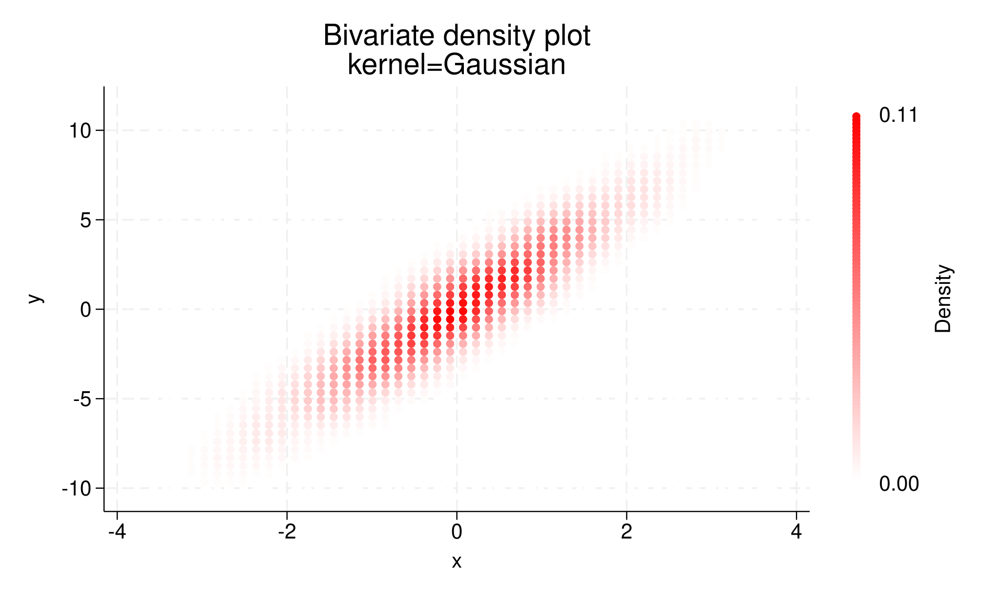

In [46]:
%%stata -qui
// use colorrule(), colorstart(), and colorend() to control colors
use dens.dta, clear
rename _y y
rename _x x

sum d
local min = `r(min)'
local max = `r(max)'
twoway scatter y x, colorvar(d) colorlevels(100) /// 
     colorrule(linear) colorstart(white) colorend(red) ///
     zlabel(`min' `max', noticks format(%4.2f))  /// 
     zscale(noline)     ///
     title("Bivariate density plot" "kernel=Gaussian")

## Use *colorvar()* to  visualize Second National Health and Nutrition Examination Survey data

In [47]:
%%stata
// https://www.stata.com/stata-news/news38-4/color-coded-twoway-graphs/
//  Second National Health and Nutrition Examination Survey 
// (NHANES II) (McDowell et al. 1981)
webuse nhanes2, clear
describe


. // https://www.stata.com/stata-news/news38-4/color-coded-twoway-graphs/
. //  Second National Health and Nutrition Examination Survey 
. // (NHANES II) (McDowell et al. 1981)
. webuse nhanes2, clear

. describe

Contains data from https://www.stata-press.com/data/r18/nhanes2.dta
 Observations:        10,351                  
    Variables:            58                  20 Dec 2022 10:07
-------------------------------------------------------------------------------
Variable      Storage   Display    Value
    name         type    format    label      Variable label
-------------------------------------------------------------------------------
sampl           long    %9.0g                 Unique case identifier
strata          byte    %9.0g                 Stratum identifier
psu             byte    %9.0g      psulbl     Primary sampling unit
region          byte    %9.0g      region     Region
smsa            byte    %22.0g     smsalbl    SMSA type
location        byte    %9.0g    

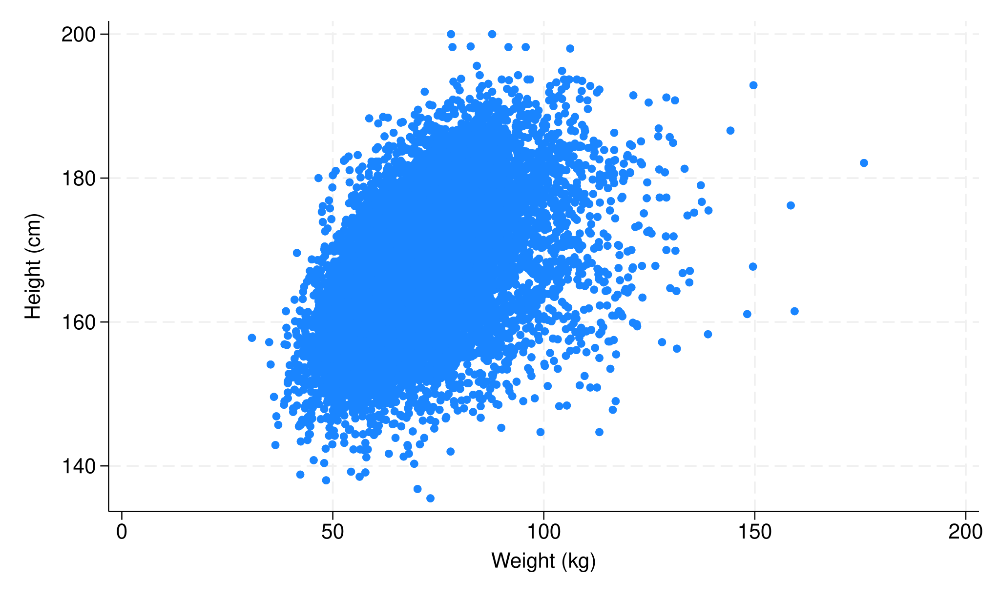

In [48]:
%%stata -qui
// a simple scatterplot of height and weight
webuse nhanes2, clear
scatter height weight

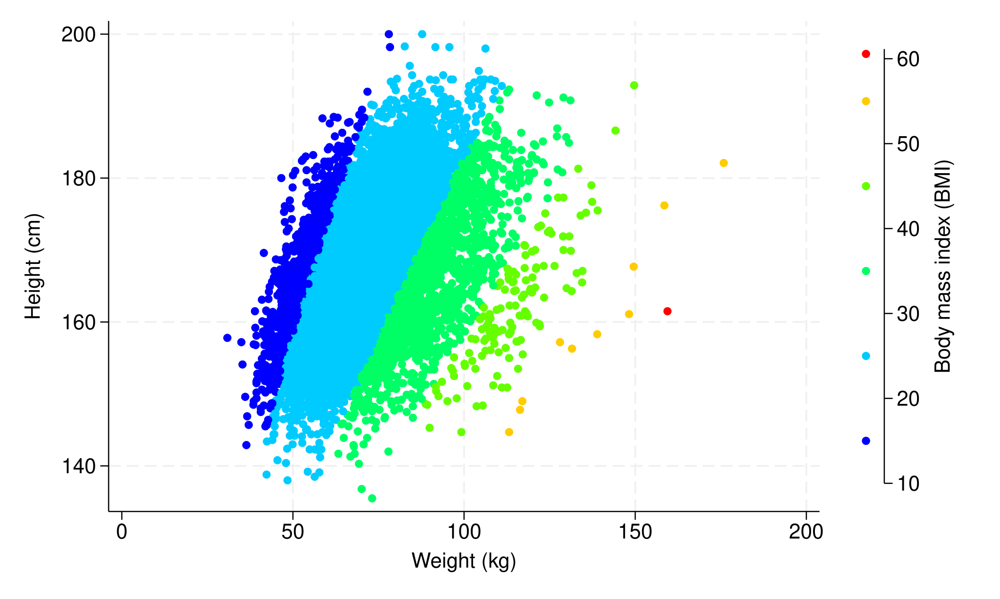

In [49]:
%%stata -qui
webuse nhanes2, clear
//color-code the points based on the body mass index (bmi)
scatter height weight, colorvar(bmi)

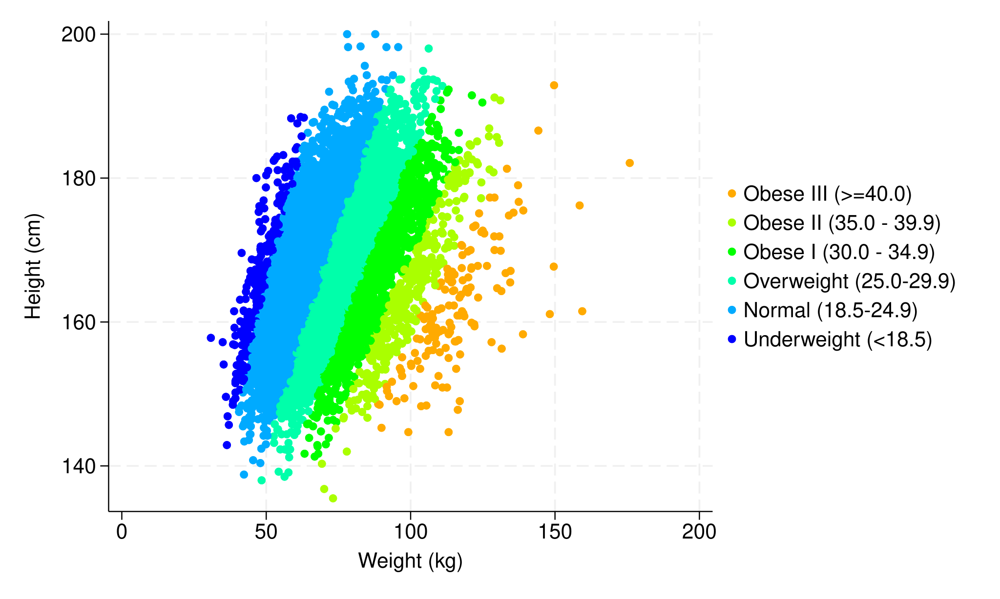

In [50]:
%%stata -qui
webuse nhanes2, clear
// categorize bmi based on the cutoffs provided by the World Health Organization (WHO)
generate bmicat = irecode(bmi, 18.4, 24.9, 29.9, 34.9, 39.9) + 1
label define bmicategory 1 "Underweight (<18.5)"    ///
     2 "Normal (18.5-24.9)" 3 "Overweight (25.0-29.9)"      ///
     4 "Obese I (30.0 - 34.9)" 5 "Obese II (35.0 - 39.9)"   ///
     6 "Obese III (>=40.0)"
label values bmicat bmicategory
scatter height weight, colorvar(bmicat)    ///
     colordiscrete  coloruseplegend        ///
     zlabel(, valuelabel)                  

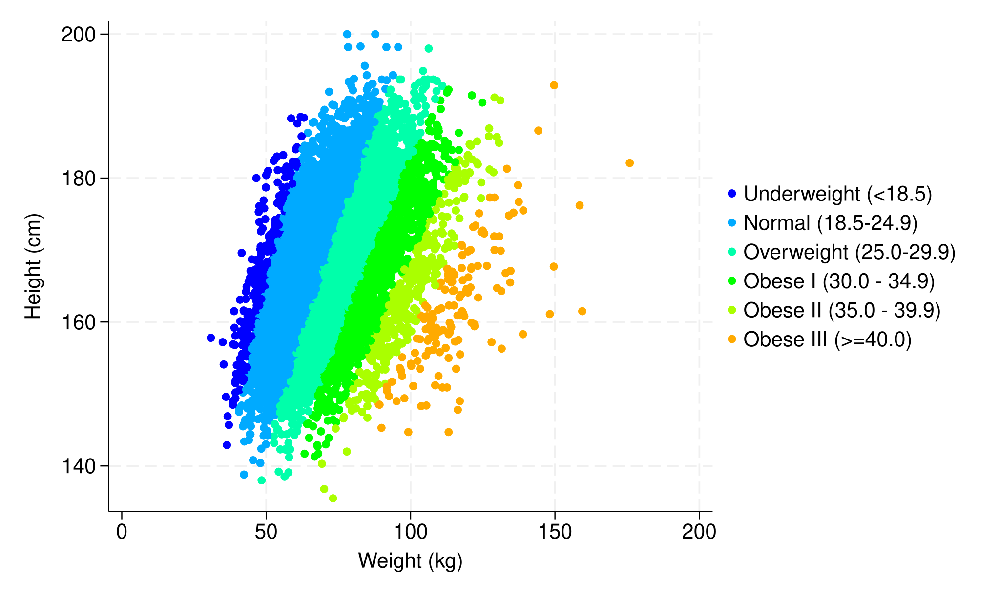

In [51]:
%%stata -qui
// reverse the order of plegend keys
scatter height weight, colorvar(bmicat)    ///
     colordiscrete  coloruseplegend        ///
     plegend(order(6 5 4 3 2 1))           ///
     zlabel(, valuelabel)        

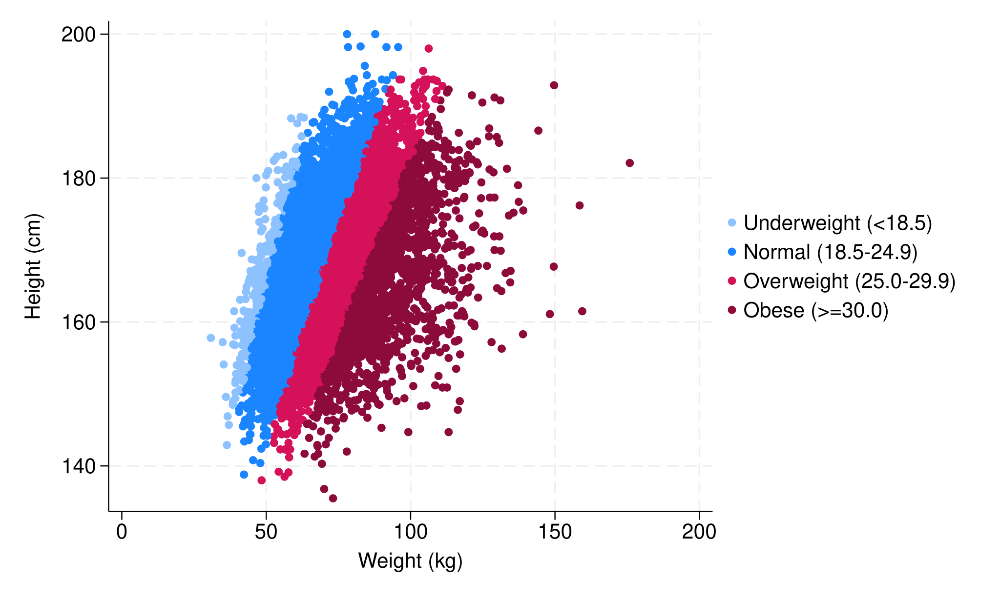

In [52]:
%%stata -qui
// change color for each level 
// and color level 4, 5, and 6 with the same color 
scatter height weight, colorvar(bmicat)    ///
     colordiscrete  coloruseplegend        ///
     colorlist(stc1*0.5 stc1 stc2 stc2*1.5)    ///
     plegend(order(6 5 4 3 "Obese (>=30.0)"))           ///
     zlabel(, valuelabel)    

For the last example, we revisit Chuck Huber's _Stata News_ article [Visualizing continuous-by-continuous interactions with margins and twoway contour](https://www.stata.com/stata-news/news32-1/spotlight/).

In this article, Chuck fit a logistic regression model for high blood pressure, __highbp__, with continuous covariates __age__ and __weight__ and their interaction. Then he used __margins__ to estimate the predicted probability of hypertension for combinations of __age__ and __weight__, with values of __age__ ranging from 20 to 80 years in increments of 5 and values of __weight__ ranging from 40 to 180 kilograms in increments of 5. Then he used __twoway contour__ to plot the resulting predictions:

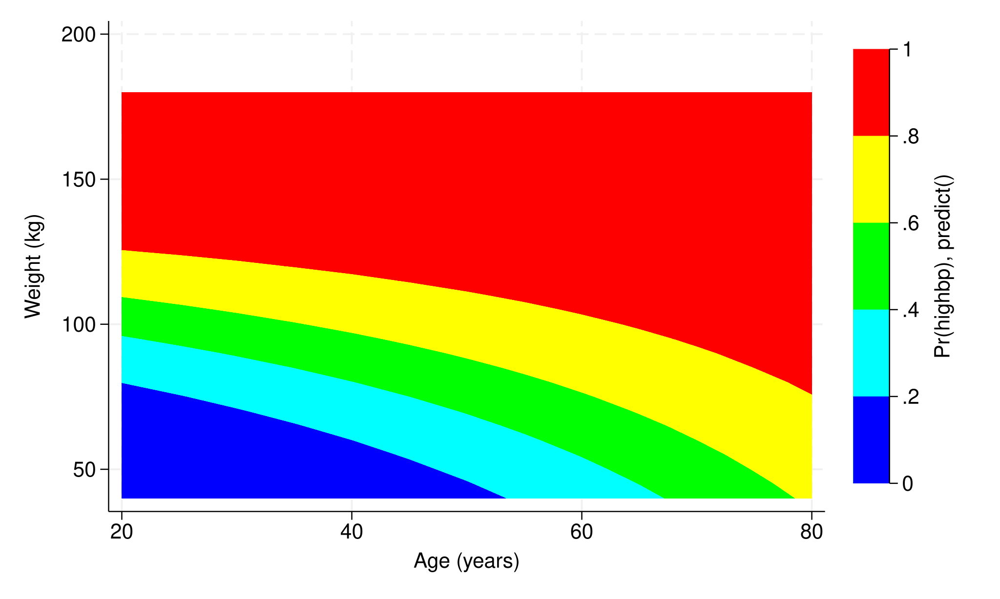

In [53]:
%%stata -qui
webuse nhanes2, clear
svy: logistic highbp age weight c.age#c.weight
quietly margins, at(age=(20(5)80) weight=(40(5)180))    ///
     vce(unconditional) saving(predictions, replace)
use predictions, clear
rename _at1 age
rename _at2 weight
rename _margin pr_highbp
twoway contour pr_highbp weight age

Now with the __colorvar()__ option, we have another way to visualize these predictions. Below, we plot the predicted probabilities for each value of __weight__, using different colors to represent the values of __age__.

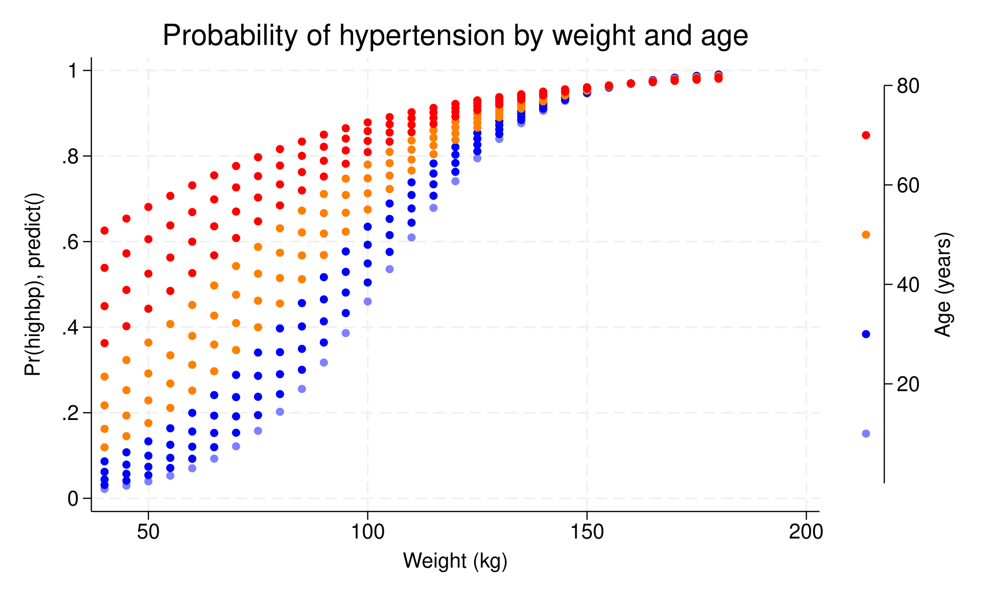

In [54]:
%%stata -qui
use predictions, clear
rename _at1 age
rename _at2 weight
rename _margin pr_highbp
scatter pr_highbp weight, colorvar(age)    ///
     colorlist(blue*0.5 blue orange red)   ///
     title("Probability of hypertension by weight and age")

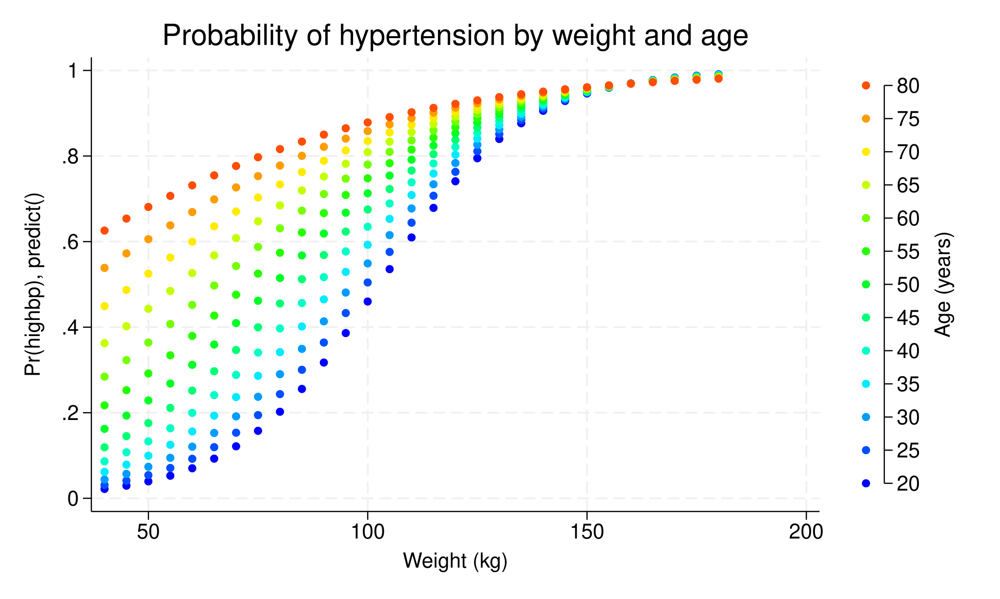

In [55]:
%%stata -qui
// ages contain 13 different values, why not plot all of them
use predictions, clear
rename _at1 age
rename _at2 weight
rename _margin pr_highbp
scatter pr_highbp weight, colorvar(age)    ///
     colordiscrete zlabel(#13)     ///
     title("Probability of hypertension by weight and age")

In [56]:
## Community-contributed commands

### *catplot*

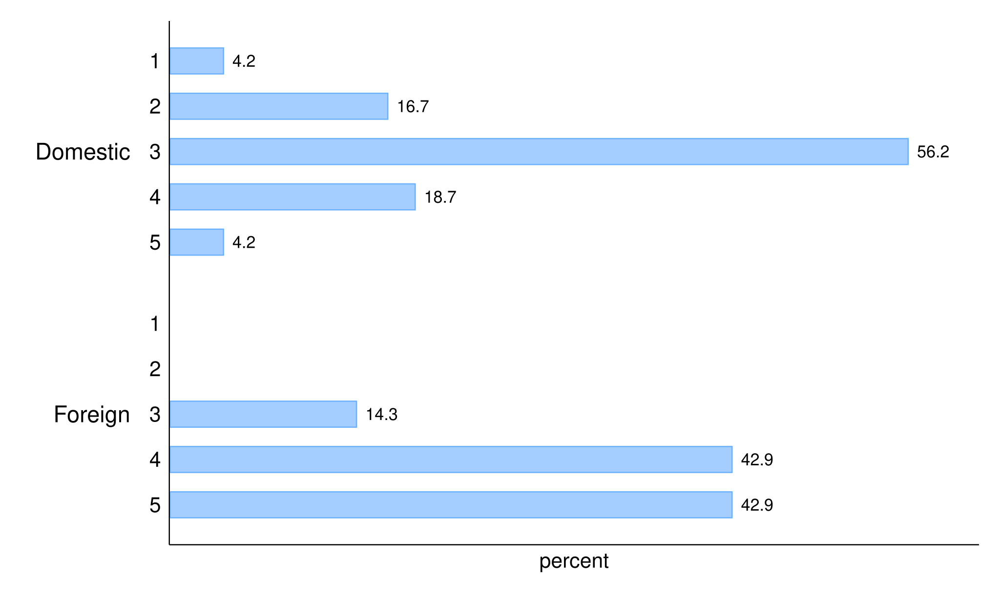

In [57]:
%%stata -qui
** ssc install catplot
sysuse auto, clear
catplot rep78 foreign, percent(foreign)                /// 
    bar(1, bcolor(%40)) blabel(bar, position(outside)  /// 
    format(%3.1f)) ylabel(none) yscale(r(0,60))

### *coefplot*

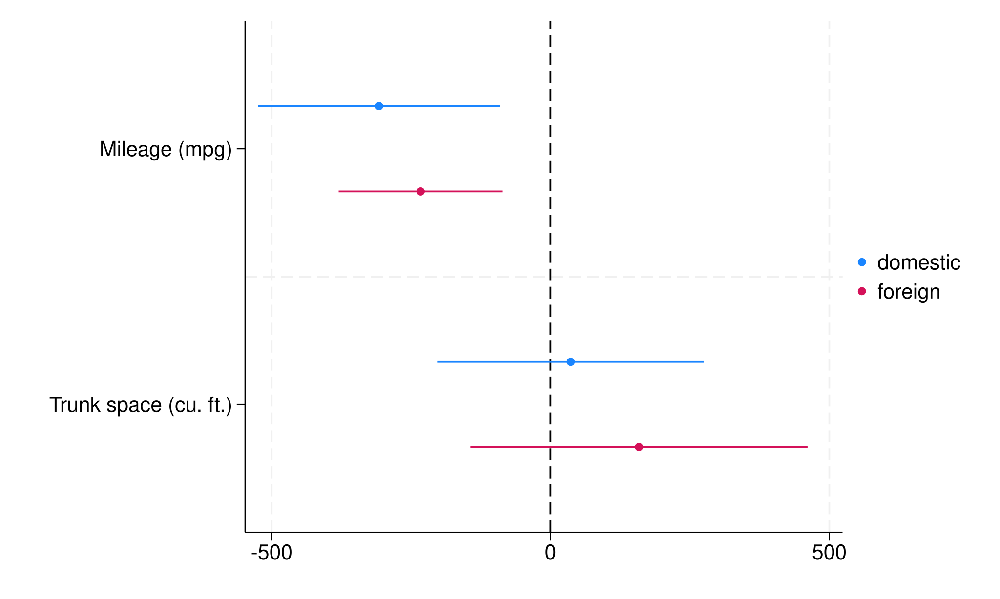

In [58]:
%%stata -qui
** https://repec.sowi.unibe.ch/stata/coefplot
** ssc install coefplot
sysuse auto, clear
regress price mpg trunk if !foreign
estimates store domestic
regress price mpg trunk if foreign
estimates store foreign
coefplot domestic foreign, drop(_cons) xline(0)

### _grmap_

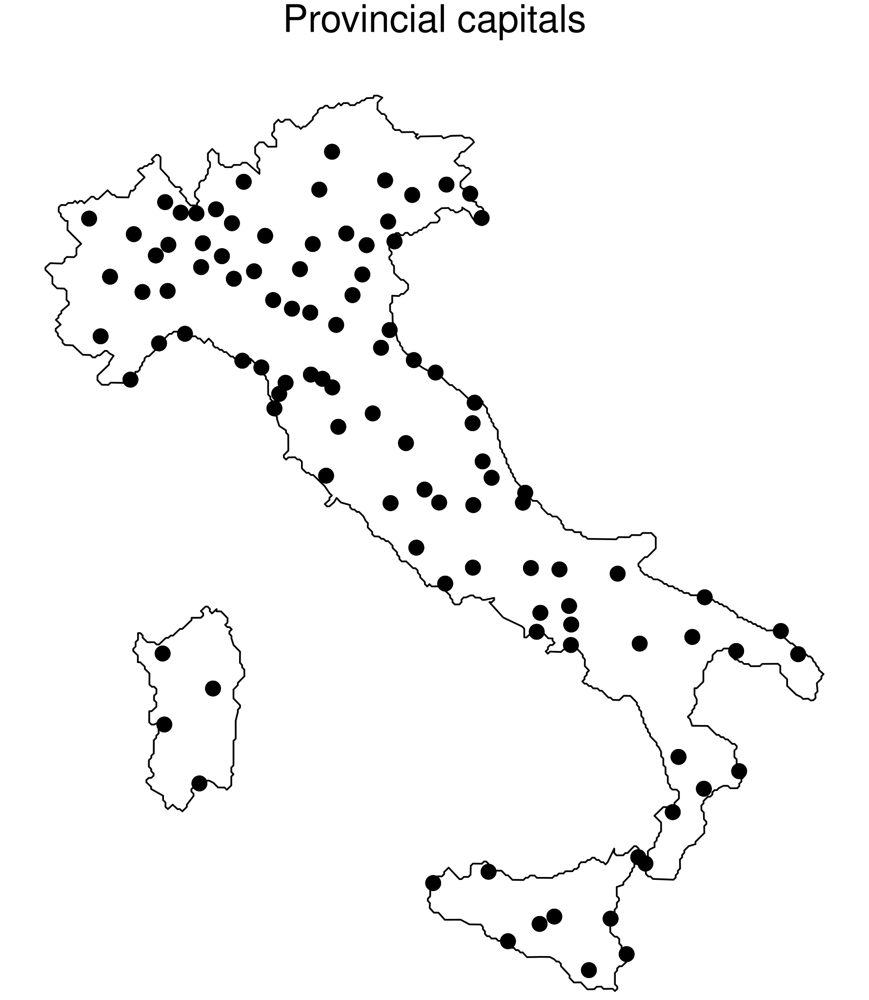

In [59]:
%%stata -qui
// copy grmap sample data
capture grmap_copy
use italy-outlinedata.dta, clear
grmap, title("Provincial capitals" " ", size(*0.9))   ///
  point(data("italy-capitals.dta") xcoord(xcoord) ycoord(ycoord))


### *geoplot* : <https://github.com/benjann/geoplot>

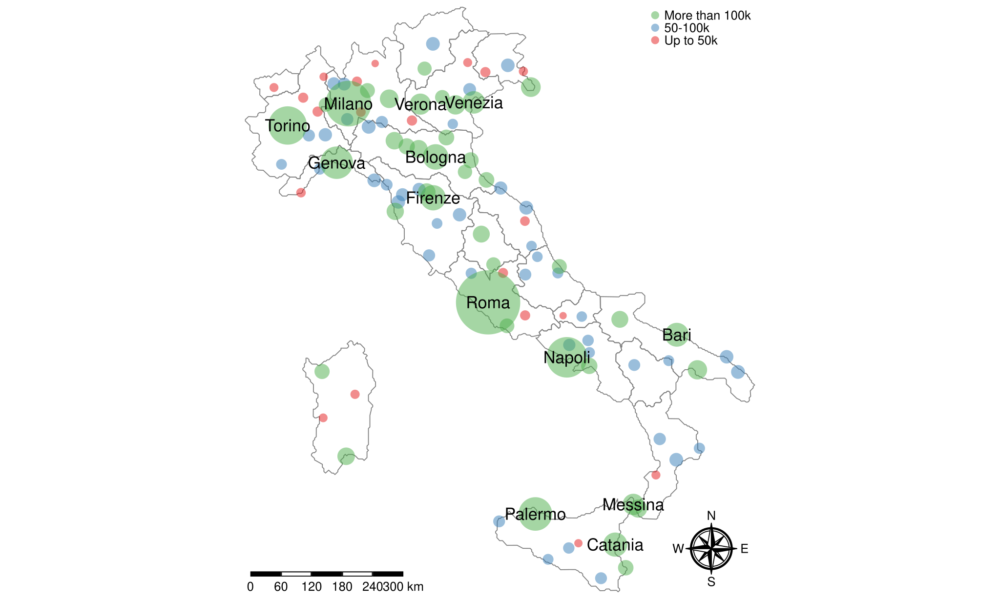

In [60]:
%%stata -qui
** Stata version 16.1 or newer
** ssc install: geoplot palettes colrspace moremata
clear all
// get data
local url http://fmwww.bc.edu/repec/bocode/i/
geoframe create regions  `url'Italy-RegionsData.dta, id(id) coord(xcoord ycoord) ///
    shp(Italy-RegionsCoordinates.dta)
geoframe create country  `url'Italy-OutlineCoordinates.dta
geoframe create capitals `url'Italy-Capitals.dta, coord(xcoord ycoord)
geoframe create lakes    `url'Italy-Lakes.dta, feature(water)
geoframe create rivers   `url'Italy-Rivers.dta, feature(water)
geoplot (area regions) ///
    (point capitals i.size [w=pop98], color(Set1%50) mlcolor(%0)) ///
    (label capitals city if pop98>250000, color(black)) ///
    , legend compass sbar(length(300) units(km))

### *sankey* plot: <https://github.com/asjadnaqvi/The-Stata-Guide?tab=readme-ov-file>

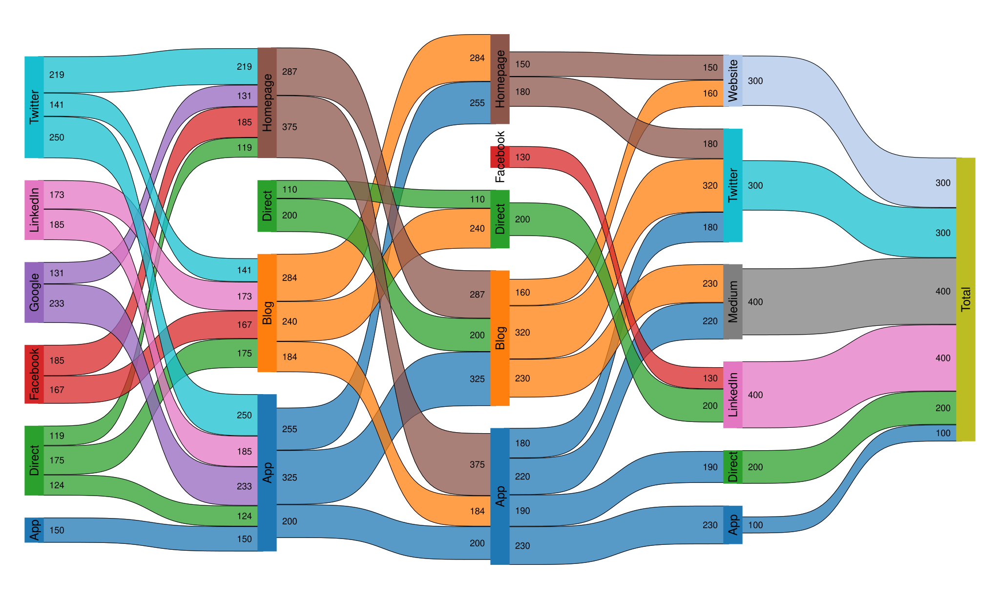

In [61]:
%%stata -qui
** https://github.com/asjadnaqvi/stata-sankey
** ssc install sankey, replace
** ssc install palettes, replace
** ssc install colrspace, replace

import excel using "https://github.com/asjadnaqvi/stata-sankey/blob/main/data/sankey_example2.xlsx?raw=true", clear first
sankey value, from(source) to(destination) by(layer)

## Thanks!